In [40]:
!nvidia-smi

Mon Jul 21 16:10:12 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   75C    P0             33W /   70W |   12590MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


## Instalacja Grounding DINO

In [3]:
%cd /content

/content


In [4]:
import os
HOME = os.getcwd()

In [5]:
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 463, done.
remote: Total 463 (delta 0), reused 0 (delta 0), pack-reused 463 (from 1)
Receiving objects: 100% (463/463), 12.91 MiB | 41.44 MiB/s, done.
Resolving deltas: 100% (220/220), done.


In [6]:
%cd /content/GroundingDINO/groundingdino/models/GroundingDINO/csrc/MsDeformAttn
!sed -i 's/value.type()/value.scalar_type()/g' ms_deform_attn_cuda.cu
!sed -i 's/value.scalar_type().is_cuda()/value.is_cuda()/g' ms_deform_attn_cuda.cu

/content/GroundingDINO/groundingdino/models/GroundingDINO/csrc/MsDeformAttn


In [7]:
%cd {HOME}/GroundingDINO
!pip install -q -e .
!pip install supervision

/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.7/206.7 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 122.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB

## Instalacja SAM

In [8]:
%cd {HOME}

import sys
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

/content
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-f1k345ay
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-f1k345ay
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=07e6f74c8b1857c3f733fc0edf830f8651dee249ff8759e611eb39dbb03fbf23
  Stored in directory: /tmp/pip-ephem-wheel-cache-s06ld_24/wheels/15/d7/bd/05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment_anything


In [9]:
!pip uninstall -y supervision
!pip install -q supervision==0.6.0

import supervision as sv
print(sv.__version__)

Found existing installation: supervision 0.26.0
Uninstalling supervision-0.26.0:
  Successfully uninstalled supervision-0.26.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
groundingdino 0.1.0 requires supervision>=0.22.0, but you have supervision 0.6.0 which is incompatible.
0.6.0


## Instalacja LAMA

In [10]:
%cd {HOME}
!git clone https://github.com/advimman/lama.git

!pip install wldhx.yadisk-direct
!pip install --upgrade pip
!pip install numpy==1.26.4 --only-binary=:all:
!pip uninstall --yes --quiet osqp
!pip install -U scikit-survival
!pip uninstall kornia -y
!pip install kornia --no-dependencies
!pip install kornia-rs
!pip install pytorch-lightning
!pip install hydra-core
!pip install webdataset
!pip install torch torchvision torchaudio torchtext
!pip install -r lama/requirements.txt --quiet
!pip install wget --quiet
!pip install -q lpips


%cd /content/lama

!curl -LJO https://huggingface.co/smartywu/big-lama/resolve/main/big-lama.zip
!unzip big-lama.zip

!pip uninstall opencv-python-headless -y --quiet
!pip install opencv-python-headless==4.1.2.30 --quiet
!pip install --upgrade opencv-python
!pip install opencv-python==4.5.5.64

!pip uninstall albumentations -y
!pip install albumentations==0.5.2

!pip uninstall opencv-python-headless opencv-python opencv-contrib-python -y
!pip install opencv-python-headless==4.9.0.80
!pip install numpy==1.26.4 --only-binary=:all:



!pip install xformers --index-url https://download.pytorch.org/whl/cu124

/content
Cloning into 'lama'...
remote: Enumerating objects: 478, done.
remote: Counting objects: 100% (306/306), done.
remote: Compressing objects: 100% (179/179), done.
remote: Total 478 (delta 174), reused 127 (delta 127), pack-reused 172 (from 1)
Receiving objects: 100% (478/478), 8.84 MiB | 40.39 MiB/s, done.
Resolving deltas: 100% (195/195), done.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 20.3 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 124.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python-headles

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 61.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 60.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [scikit-survival]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 40.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.5/963.5 kB 33.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [pytorch-lightning]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [webdataset]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 35.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.8/29.8 MB 63.2 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for out

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.5/60.5 MB 52.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.12.0.88
    Uninstalling opencv-python-4.12.0.88:
      Successfully uninstalled opencv-python-4.12.0.88
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
groundingdino 0.1.0 requires supervision>=0.22.0, but you have supervision 0.6.0 which is incompatible.


Found existing installation: albumentations 2.0.8
Uninstalling albumentations-2.0.8:
  Successfully uninstalled albumentations-2.0.8
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 25.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 MB 129.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [albumentations]
Found existing installation: opencv-python-headless 4.12.0.88
Uninstalling opencv-python-headless-4.12.0.88:
  Successfully uninstalled opencv-python-headless-4.12.0.88
Found existing installation: opencv-python 4.5.5.64
Uninstalling opencv-python-4.5.5.64:
  Successfully uninstalled opencv-python-4.5.5.64
Found existing installation: opencv-contrib-python 4.11.0.86
Uninstalling opencv-contrib-python-4.11.0.86:
  Successfully uninstalled opencv-contrib-python-4.11.0.86
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 MB 136.5 MB/s eta 0:00:00


  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
supervision 0.6.0 requires opencv-python, which is not installed.
imgaug 0.4.0 requires opencv-python, which is not installed.
dopamine-rl 4.1.2 requires opencv-python>=3.4.8.29, which is not installed.
groundingdino 0.1.0 requires opencv-python, which is not installed.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
groundingdino 0.1.0 requires supervision>=0.22.0, but you have supervision 0.6.0 which is incompatible.


Looking in indexes: https://download.pytorch.org/whl/cu124
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.4/43.4 MB 57.1 MB/s eta 0:00:00


## Wagi Grounding DINO

In [5]:
import os

GROUNDING_DINO_CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(GROUNDING_DINO_CONFIG_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CONFIG_PATH))

/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


In [6]:
%cd {HOME}
!mkdir -p {HOME}/weights
%cd {HOME}/weights

!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/content
/content/weights


In [7]:
import os

GROUNDING_DINO_CHECKPOINT_PATH = os.path.join(HOME, "weights", "groundingdino_swint_ogc.pth")
print(GROUNDING_DINO_CHECKPOINT_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CHECKPOINT_PATH))

/content/weights/groundingdino_swint_ogc.pth ; exist: True


## Wagi SAM

In [8]:
%cd {HOME}
!mkdir -p {HOME}/weights
%cd {HOME}/weights

!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

/content
/content/weights


In [9]:
import os

SAM_CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(SAM_CHECKPOINT_PATH, "; exist:", os.path.isfile(SAM_CHECKPOINT_PATH))

/content/weights/sam_vit_h_4b8939.pth ; exist: True


## Ładowanie modeli

In [10]:
import torch

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#### Ładowanie DINO

In [11]:
%cd {HOME}/GroundingDINO

from groundingdino.util.inference import Model

grounding_dino_model = Model(model_config_path=GROUNDING_DINO_CONFIG_PATH, model_checkpoint_path=GROUNDING_DINO_CHECKPOINT_PATH)

/content/GroundingDINO


/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

#### Ładowanie SAM

In [12]:
SAM_ENCODER_VERSION = "vit_h"

In [13]:
from segment_anything import sam_model_registry, SamPredictor

sam = sam_model_registry[SAM_ENCODER_VERSION](checkpoint=SAM_CHECKPOINT_PATH).to(device=DEVICE)
sam_predictor = SamPredictor(sam)

#### Ładowanie Stable Diffusion

In [14]:
%cd {HOME}

import torch
from diffusers import StableDiffusionInpaintPipeline
from PIL import Image, ImageOps
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
import io
import os

model_id = "stabilityai/stable-diffusion-2-inpainting"
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if DEVICE == "cuda" else torch.float32,
    safety_checker=None,
    requires_safety_checker=False
)
pipe = pipe.to(DEVICE)


if DEVICE == "cuda":
    pipe.enable_attention_slicing()
    pipe.enable_model_cpu_offload()

print("Model loaded successfully!")

/content


model_index.json:   0%|          | 0.00/544 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/638 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/829 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/914 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Model loaded successfully!


#### torch.load issue fix

In [15]:
import fileinput
import sys

file_path = '/content/lama/saicinpainting/training/trainers/__init__.py'


with open(file_path, 'r') as file:
    content = file.read()

content = content.replace(
    'state = torch.load(path, map_location=map_location)',
    'state = torch.load(path, map_location=map_location, weights_only=False)'
)

with open(file_path, 'w') as file:
    file.write(content)

print("Fixed torch.load issue")

Fixed torch.load issue


In [16]:
import os
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import lpips
from scipy import linalg
import json
from tqdm import tqdm
import shutil
import re
from glob import glob

## GOOGLE DRIVE SETUP + DATASET LOADING

In [17]:
%cd {HOME}

def setup_google_drive():
    """Mount Google Drive and setup access"""
    try:
        from google.colab import drive
        drive.mount('/content/drive')
        print("Google Drive mounted successfully!")
        return True
    except:
        print("Failed to mount Google Drive. Make sure you're running in Colab.")
        return False

def discover_dataset_pairs_with_method(base_path='/content/drive/MyDrive/RORD', method="lama"):
    """Discover pairs and generate appropriate inpainted filenames based on method"""

    if not os.path.exists(base_path):
        print(f"Dataset path not found: {base_path}")
        return {}

    pairs = {}
    object_folders = [f for f in os.listdir(base_path)
                     if os.path.isdir(os.path.join(base_path, f))]

    print(f"Found object folders: {object_folders}")

    for folder_name in object_folders:
        folder_path = os.path.join(base_path, folder_name)
        pairs[folder_name] = []

        files = os.listdir(folder_path)
        yes_files = [f for f in files if '_yes' in f and f.endswith('.jpg')]

        for yes_file in yes_files:
            try:
                base_name = yes_file.replace('.jpg', '')

                if '_yes' not in base_name:
                    continue

                prompt_part, id_part = base_name.rsplit('_yes', 1)
                pair_id = id_part
                prompt = prompt_part

                no_file = f"{prompt}_no{pair_id}.jpg"

                if method.lower() == "lama":
                    inpainted_file = f"{prompt}_inpainted_lama{pair_id}.jpg"
                elif method.lower() in ["stable_diffusion", "sd"]:
                    inpainted_file = f"{prompt}_inpainted_sd{pair_id}.jpg"
                else:
                    inpainted_file = f"{prompt}_inpainted_{method}{pair_id}.jpg"

                yes_path = os.path.join(folder_path, yes_file)
                no_path = os.path.join(folder_path, no_file)
                inpainted_path = os.path.join(folder_path, inpainted_file)

                if os.path.exists(no_path):
                    pairs[folder_name].append({
                        'id': pair_id,
                        'prompt': prompt,
                        'yes_path': yes_path,
                        'no_path': no_path,
                        'inpainted_path': inpainted_path,
                        'folder_name': folder_name
                    })
                    print(f"Found pair: prompt='{prompt}', id={pair_id}, method={method}")
                else:
                    print(f"Missing no file for {yes_file}")

            except Exception as e:
                print(f"Error processing {yes_file}: {str(e)}")
                continue

        print(f"{folder_name}: {len(pairs[folder_name])} pairs found")

    total_pairs = sum(len(pairs[obj]) for obj in pairs)
    print(f"Total pairs found: {total_pairs}")

    return pairs

/content


## EVALUATION METRICS IMPLEMENTATION

In [18]:
class InpaintingEvaluator:
    def __init__(self, device='cuda'):
        self.device = device

        self.lpips_model = lpips.LPIPS(net='alex').to(device)

        self.feature_model = models.resnet50(pretrained=True).to(device)
        self.feature_model = torch.nn.Sequential(*list(self.feature_model.children())[:-1])
        self.feature_model.eval()

        self.feature_transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def calculate_psnr(self, img1, img2):
        """Calculate Peak Signal-to-Noise Ratio"""
        return psnr(img1, img2, data_range=255)

    def calculate_ssim(self, img1, img2):
        """Calculate Structural Similarity Index"""
        if len(img1.shape) == 3:
            img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
            img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
        else:
            img1_gray, img2_gray = img1, img2

        return ssim(img1_gray, img2_gray, data_range=255)

    def calculate_lpips(self, img1, img2):
        """Calculate Learned Perceptual Image Patch Similarity"""
        img1_tensor = transforms.ToTensor()(img1).unsqueeze(0).to(self.device)
        img2_tensor = transforms.ToTensor()(img2).unsqueeze(0).to(self.device)

        img1_tensor = img1_tensor * 2.0 - 1.0
        img2_tensor = img2_tensor * 2.0 - 1.0

        with torch.no_grad():
            lpips_score = self.lpips_model(img1_tensor, img2_tensor)

        return lpips_score.item()

    def get_features(self, images):
        """Extract features using ResNet for FID calculation"""
        features = []

        for img in images:
            if isinstance(img, np.ndarray):
                img_pil = Image.fromarray(img.astype(np.uint8))
            else:
                img_pil = img

            img_tensor = self.feature_transform(img_pil).unsqueeze(0).to(self.device)

            with torch.no_grad():
                feature = self.feature_model(img_tensor)
                feature = feature.view(feature.size(0), -1).cpu().numpy()
                features.append(feature.flatten())

        return np.array(features)

    def calculate_fid(self, real_images, generated_images):
        """Calculate Frechet Inception Distance using ResNet features"""
        if len(real_images) < 2 or len(generated_images) < 2:
            print("Skipping FID calculation: need at least 2 images in each set")
            return float('inf')

        try:
            real_features = self.get_features(real_images)
            gen_features = self.get_features(generated_images)

            mu1, sigma1 = real_features.mean(axis=0), np.cov(real_features, rowvar=False)
            mu2, sigma2 = gen_features.mean(axis=0), np.cov(gen_features, rowvar=False)

            if real_features.shape[0] == 1:
                sigma1 = np.eye(real_features.shape[1]) * 1e-6
            if gen_features.shape[0] == 1:
                sigma2 = np.eye(gen_features.shape[1]) * 1e-6

            sigma1 += np.eye(sigma1.shape[0]) * 1e-6
            sigma2 += np.eye(sigma2.shape[0]) * 1e-6

            diff = mu1 - mu2
            covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)

            if np.iscomplexobj(covmean):
                covmean = covmean.real

            fid = diff.dot(diff) + np.trace(sigma1 + sigma2 - 2 * covmean)
            return fid

        except Exception as e:
            print(f"FID calculation failed: {str(e)}")
            return float('inf')

## PIPELINE INTEGRATION

In [32]:
def segment_and_dilate(sam_predictor, image, xyxy, dilation=15):
    """SAM segmentation with dilation"""
    sam_predictor.set_image(image)
    result_masks = []

    for box in xyxy:
        masks, scores, logits = sam_predictor.predict(box=box, multimask_output=True)
        index = np.argmax(scores)
        mask = masks[index]

        # Dilate mask
        kernel_size = 2 * dilation + 1
        kernel = np.ones((kernel_size, kernel_size), np.uint8)
        mask_dilated = cv2.dilate(mask.astype(np.uint8), kernel, iterations=1)
        result_masks.append(mask_dilated)

    return np.array(result_masks)

def run_stable_diffusion_inpainting(image, mask, prompt, pipe):
    """Run Stable Diffusion inpainting"""
    try:
        if isinstance(image, np.ndarray):
            if len(image.shape) == 3 and image.shape[2] == 3:
                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            else:
                image_rgb = image
            pil_image = Image.fromarray(image_rgb.astype(np.uint8))
        else:
            pil_image = image

        if isinstance(mask, np.ndarray):
            mask_binary = (mask > 0).astype(np.uint8) * 255
            pil_mask = Image.fromarray(mask_binary)
        else:
            pil_mask = mask

        original_size = pil_image.size
        max_size = 768

        if max(original_size) > max_size:
            ratio = max_size / max(original_size)
            new_size = (int(original_size[0] * ratio), int(original_size[1] * ratio))
            pil_image = pil_image.resize(new_size, Image.Resampling.LANCZOS)
            pil_mask = pil_mask.resize(new_size, Image.Resampling.NEAREST)
            print(f"Resized from {original_size} to {new_size} for SD processing")

        inpainting_prompt = f"scene without {prompt}, photorealistic, high quality"
        print(f"SD inpainting prompt: '{inpainting_prompt}'")

        with torch.autocast("cuda" if pipe.device.type == "cuda" else "cpu"):
            result = pipe(
                prompt=inpainting_prompt,
                image=pil_image,
                mask_image=pil_mask,
                num_inference_steps=20,
                guidance_scale=7.5,
                strength=0.99,
                generator=torch.Generator(device=pipe.device).manual_seed(42)
            ).images[0]

        if max(original_size) > max_size:
            result = result.resize(original_size, Image.Resampling.LANCZOS)

        result_array = np.array(result)
        return result_array

    except Exception as e:
        print(f"Stable Diffusion inpainting failed: {str(e)}")
        return None

def run_inpainting_pipeline_with_method(image_path, prompt, output_path, method="lama",
                                       pipe=None, box_threshold=0.35, text_threshold=0.25):
    """Run inpainting pipeline with selectable method"""

    image = cv2.imread(image_path)
    if image is None:
        print(f"Could not load image: {image_path}")
        return None

    print(f"Using prompt: '{prompt}' for image: {os.path.basename(image_path)}")
    print(f"Using method: {method}")

    detections = grounding_dino_model.predict_with_classes(
        image=image,
        classes=[prompt],
        box_threshold=box_threshold,
        text_threshold=text_threshold
    )

    print(f"Detected {len(detections.xyxy)} objects")

    detections.mask = segment_and_dilate(
        sam_predictor=sam_predictor,
        image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
        xyxy=detections.xyxy,
        dilation=15
    )

    combined_mask = np.any(detections.mask, axis=0).astype(np.uint8)

    if method.lower() == "lama":
        temp_dir = '/content/temp_inpainting'
        os.makedirs(temp_dir, exist_ok=True)

        cv2.imwrite(f'{temp_dir}/input.jpg', image)
        Image.fromarray(combined_mask * 255).save(f'{temp_dir}/input_mask.png')

        current_dir = os.getcwd()
        os.chdir('/content/lama')

        os.system(f"""
        PYTHONPATH=. TORCH_HOME=$(pwd) python3 bin/predict.py \
            model.path=$(pwd)/big-lama \
            indir={temp_dir} \
            outdir={temp_dir}/output \
            dataset.img_suffix=.jpg > /dev/null 2>&1
        """)

        os.chdir(current_dir)

        result_path = f'{temp_dir}/output/input_mask.png'
        if os.path.exists(result_path):
            inpainted_image = cv2.imread(result_path)
            inpainted_result = cv2.cvtColor(inpainted_image, cv2.COLOR_BGR2RGB)
        else:
            print(f"LaMa inpainting failed")
            return None

    elif method.lower() == "stable_diffusion" or method.lower() == "sd":
        if pipe is None:
            print("Stable Diffusion pipeline not provided")
            return None

        inpainted_result = run_stable_diffusion_inpainting(image, combined_mask, prompt, pipe)

        if inpainted_result is None:
            return None

    else:
        print(f"Unknown method: {method}")
        return None

    result_bgr = cv2.cvtColor(inpainted_result, cv2.COLOR_RGB2BGR)
    cv2.imwrite(output_path, result_bgr)
    print(f"Saved {method} result to: {output_path}")

    return inpainted_result

## MAIN EVALUATION FUNCTION

In [20]:
def evaluate_custom_dataset(base_path='/content/drive/MyDrive/RORD', max_pairs_per_folder=None,
                           method="lama", pipe=None):
    """Evaluate inpainting pipeline with selectable method"""

    if not os.path.exists('/content/drive'):
        print("🔗 Mounting Google Drive...")
        if not setup_google_drive():
            return None

    if method.lower() in ["stable_diffusion", "sd"] and pipe is None:
        print("Stable Diffusion pipeline required for SD method!")
        print("Load it first with:")
        print("   from diffusers import StableDiffusionInpaintPipeline")
        print("   pipe = StableDiffusionInpaintPipeline.from_pretrained(...)")
        return None

    print(f"Using inpainting method: {method}")

    pairs_dict = discover_dataset_pairs_with_method(base_path, method)

    if not pairs_dict:
        print("No valid pairs found!")
        return None

    evaluator = InpaintingEvaluator()

    results = {
        'method': method,
        'psnr_scores': [],
        'ssim_scores': [],
        'lpips_scores': [],
        'prompts': [],
        'pair_ids': [],
        'folder_names': [],
        'success_count': 0,
        'total_count': 0,
        'per_folder_results': {},
        'per_prompt_results': {}
    }

    inpainted_images = []
    ground_truth_images = []

    print("Running evaluation...")

    for folder_name, pairs in pairs_dict.items():
        print(f"\n Processing folder '{folder_name}' ({len(pairs)} pairs)")

        if max_pairs_per_folder:
            pairs = pairs[:max_pairs_per_folder]

        folder_results = {
            'psnr_scores': [],
            'ssim_scores': [],
            'lpips_scores': [],
            'success_count': 0
        }

        for pair in tqdm(pairs, desc=f"Processing {folder_name}"):
            try:
                results['total_count'] += 1

                print(f"Processing {method} inpainting for: {os.path.basename(pair['yes_path'])}")
                inpainted_result = run_inpainting_pipeline_with_method(
                    pair['yes_path'],
                    pair['prompt'],
                    pair['inpainted_path'],
                    method=method,
                    pipe=pipe
                )

                if inpainted_result is None:
                    continue

                gt_image = cv2.imread(pair['no_path'])
                gt_image = cv2.cvtColor(gt_image, cv2.COLOR_BGR2RGB)

                if inpainted_result.shape[:2] != gt_image.shape[:2]:
                    inpainted_result = cv2.resize(inpainted_result,
                                                (gt_image.shape[1], gt_image.shape[0]))

                psnr_score = evaluator.calculate_psnr(gt_image, inpainted_result)
                ssim_score = evaluator.calculate_ssim(gt_image, inpainted_result)
                lpips_score = evaluator.calculate_lpips(gt_image, inpainted_result)

                results['psnr_scores'].append(psnr_score)
                results['ssim_scores'].append(ssim_score)
                results['lpips_scores'].append(lpips_score)
                results['prompts'].append(pair['prompt'])
                results['pair_ids'].append(pair['id'])
                results['folder_names'].append(folder_name)
                results['success_count'] += 1

                folder_results['psnr_scores'].append(psnr_score)
                folder_results['ssim_scores'].append(ssim_score)
                folder_results['lpips_scores'].append(lpips_score)
                folder_results['success_count'] += 1

                if pair['prompt'] not in results['per_prompt_results']:
                    results['per_prompt_results'][pair['prompt']] = {
                        'psnr_scores': [],
                        'ssim_scores': [],
                        'lpips_scores': [],
                        'success_count': 0
                    }

                results['per_prompt_results'][pair['prompt']]['psnr_scores'].append(psnr_score)
                results['per_prompt_results'][pair['prompt']]['ssim_scores'].append(ssim_score)
                results['per_prompt_results'][pair['prompt']]['lpips_scores'].append(lpips_score)
                results['per_prompt_results'][pair['prompt']]['success_count'] += 1

                inpainted_images.append(inpainted_result)
                ground_truth_images.append(gt_image)

                print(f"Processed '{pair['prompt']}' (ID: {pair['id']}) - PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}")

            except Exception as e:
                print(f"Error processing {folder_name} pair {pair['id']}: {str(e)}")
                continue

        results['per_folder_results'][folder_name] = folder_results

        if folder_results['success_count'] > 0:
            print(f"{folder_name}: {folder_results['success_count']} successful")
            print(f"PSNR: {np.mean(folder_results['psnr_scores']):.2f}")
            print(f"SSIM: {np.mean(folder_results['ssim_scores']):.4f}")
            print(f"LPIPS: {np.mean(folder_results['lpips_scores']):.4f}")

    if len(inpainted_images) > 1:
        fid_score = evaluator.calculate_fid(ground_truth_images, inpainted_images)
        results['fid_score'] = fid_score


    print("\n" + "="*60)
    print(f"EVALUATION RESULTS - {method.upper()}")
    print("="*60)

    if results['success_count'] > 0:
        print(f"Overall Results ({results['success_count']}/{results['total_count']} successful):")
        print(f"PSNR: {np.mean(results['psnr_scores']):.2f} ± {np.std(results['psnr_scores']):.2f}")
        print(f"SSIM: {np.mean(results['ssim_scores']):.4f} ± {np.std(results['ssim_scores']):.4f}")
        print(f"LPIPS: {np.mean(results['lpips_scores']):.4f} ± {np.std(results['lpips_scores']):.4f}")

        if 'fid_score' in results:
            print(f"FID: {results['fid_score']:.2f}")

        print(f"\nPer-folder breakdown:")
        for folder_name, folder_results in results['per_folder_results'].items():
            if folder_results['success_count'] > 0:
                print(f"  {folder_name}: PSNR={np.mean(folder_results['psnr_scores']):.2f}, "
                      f"SSIM={np.mean(folder_results['ssim_scores']):.4f}, "
                      f"LPIPS={np.mean(folder_results['lpips_scores']):.4f} "
                      f"({folder_results['success_count']} samples)")

        print(f"\nPer-prompt breakdown:")
        for prompt, prompt_results in results['per_prompt_results'].items():
            if prompt_results['success_count'] > 0:
                print(f"  '{prompt}': PSNR={np.mean(prompt_results['psnr_scores']):.2f}, "
                      f"SSIM={np.mean(prompt_results['ssim_scores']):.4f}, "
                      f"LPIPS={np.mean(prompt_results['lpips_scores']):.4f} "
                      f"({prompt_results['success_count']} samples)")
    else:
        print("No successful evaluations")

    results_path = f'/content/evaluation_results_{method}.json'
    with open(results_path, 'w') as f:
        json_results = {}
        for key, value in results.items():
            if isinstance(value, list) and len(value) > 0 and isinstance(value[0], (np.float64, np.float32)):
                json_results[key] = [float(v) for v in value]
            elif isinstance(value, dict):
                json_results[key] = {}
                for k, v in value.items():
                    if isinstance(v, dict):
                        json_results[key][k] = {}
                        for k2, v2 in v.items():
                            if isinstance(v2, list) and len(v2) > 0 and isinstance(v2[0], (np.float64, np.float32)):
                                json_results[key][k][k2] = [float(x) for x in v2]
                            else:
                                json_results[key][k][k2] = v2
                    else:
                        json_results[key][k] = v
            else:
                json_results[key] = value

        json.dump(json_results, f, indent=2)

    print(f"\n Detailed results saved to: {results_path}")

    return results

## ENHANCED VISUALIZATION FUNCTIONS WITH METRIC SELECTION

In [34]:
def show_best_worst_results(results, base_path='/content/drive/MyDrive/RORD',
                           num_best=3, num_worst=3, method="lama",
                           sort_by="overall"):
    """
    Show the best and worst performing images based on selected metric - compact version
    """

    if not results or not results['psnr_scores']:
        print("No results to show")
        return

    metric_info = {
        "overall": {"name": "Overall Score", "higher_better": True, "format": "{:.3f}"},
        "psnr": {"name": "PSNR", "higher_better": True, "format": "{:.1f}"},
        "ssim": {"name": "SSIM", "higher_better": True, "format": "{:.3f}"},
        "lpips": {"name": "LPIPS", "higher_better": False, "format": "{:.3f}"},
        "fid": {"name": "FID", "higher_better": False, "format": "{:.1f}"}
    }

    if sort_by not in metric_info:
        print(f"Invalid sort_by metric: {sort_by}")
        return

    print(f"Ranking by: {metric_info[sort_by]['name']} ({'↑' if metric_info[sort_by]['higher_better'] else '↓'} better)")
    print("=" * 50)

    # Calculate scores for each image
    image_scores = []
    for i in range(len(results['psnr_scores'])):

        if sort_by == "psnr":
            score = results['psnr_scores'][i]
        elif sort_by == "ssim":
            score = results['ssim_scores'][i]
        elif sort_by == "lpips":
            score = results['lpips_scores'][i]

        image_scores.append({
            'sort_score': score,
            'psnr': results['psnr_scores'][i],
            'ssim': results['ssim_scores'][i],
            'lpips': results['lpips_scores'][i],
            'prompt': results['prompts'][i],
            'pair_id': results['pair_ids'][i],
            'folder': results['folder_names'][i]
        })

    reverse_sort = metric_info[sort_by]['higher_better']
    image_scores.sort(key=lambda x: x['sort_score'], reverse=reverse_sort)

    best_images = image_scores[:num_best]
    worst_images = image_scores[-num_worst:]
    all_to_show = best_images + worst_images

    if not all_to_show:
        print("No images to display")
        return

    fig, axes = plt.subplots(len(all_to_show), 3, figsize=(12, 3*len(all_to_show)))
    if len(all_to_show) == 1:
        axes = axes.reshape(1, -1)

    plt.subplots_adjust(hspace=0.15, wspace=0.1)

    for i, img_data in enumerate(all_to_show):
        try:
            folder_path = os.path.join(base_path, img_data['folder'])
            prompt = img_data['prompt']
            pair_id = img_data['pair_id']

            yes_path = os.path.join(folder_path, f"{prompt}_yes{pair_id}.jpg")
            no_path = os.path.join(folder_path, f"{prompt}_no{pair_id}.jpg")

            if method.lower() == "lama":
                inpainted_path = os.path.join(folder_path, f"{prompt}_inpainted_lama{pair_id}.jpg")
            elif method.lower() in ["stable_diffusion", "sd"]:
                inpainted_path = os.path.join(folder_path, f"{prompt}_inpainted_sd{pair_id}.jpg")

            def load_image_safe(path):
                if os.path.exists(path):
                    img = cv2.imread(path)
                    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB) if img is not None else np.zeros((128, 128, 3), dtype=np.uint8)
                return np.zeros((128, 128, 3), dtype=np.uint8)

            yes_img = load_image_safe(yes_path)
            inpainted_img = load_image_safe(inpainted_path)
            no_img = load_image_safe(no_path)

            is_best = i < num_best
            category = "BEST" if is_best else "WORST"
            rank = i + 1 if is_best else i - num_best + 1
            score_str = metric_info[sort_by]['format'].format(img_data['sort_score'])

            axes[i, 0].imshow(yes_img)
            axes[i, 0].set_title(f'{category} #{rank}: "{prompt}"', fontsize=9, pad=3)
            axes[i, 0].axis('off')

            axes[i, 1].imshow(inpainted_img)
            axes[i, 1].set_title(f'{method.title()}\n{metric_info[sort_by]["name"]}: {score_str}', fontsize=9, pad=3)
            axes[i, 1].axis('off')

            axes[i, 2].imshow(no_img)
            axes[i, 2].set_title(f'Ground Truth', fontsize=9, pad=3)
            axes[i, 2].axis('off')

        except Exception as e:
            print(f"Error loading {img_data['prompt']}: {str(e)}")
            continue

    fig.suptitle(f'Best & Worst Results by {metric_info[sort_by]["name"]} ({method.title()})',
                 fontsize=12, y=0.98)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    print(f"\n Summary:")
    print(f"Best {metric_info[sort_by]['name']}: {metric_info[sort_by]['format'].format(best_images[0]['sort_score'])}")
    print(f"Worst {metric_info[sort_by]['name']}: {metric_info[sort_by]['format'].format(worst_images[-1]['sort_score'])}")

def show_sample_results(base_path='/content/drive/MyDrive/RORD', num_samples=3, method="lama"):
    """Show sample before/after comparisons (updated for new structure)"""

    pairs_dict = discover_dataset_pairs_with_method(base_path, method)

    if not pairs_dict:
        print("No pairs found to display")
        return

    sample_pairs = []
    for folder_name, pairs in pairs_dict.items():
        for pair in pairs[:num_samples]:
            if os.path.exists(pair['inpainted_path']):
                sample_pairs.append(pair)

    if not sample_pairs:
        print("No inpainted samples found to display")
        return

    sample_pairs = sample_pairs[:num_samples]

    fig, axes = plt.subplots(len(sample_pairs), 3, figsize=(15, 5*len(sample_pairs)))
    if len(sample_pairs) == 1:
        axes = axes.reshape(1, -1)

    for i, pair in enumerate(sample_pairs):
        yes_img = cv2.imread(pair['yes_path'])
        yes_img = cv2.cvtColor(yes_img, cv2.COLOR_BGR2RGB)

        no_img = cv2.imread(pair['no_path'])
        no_img = cv2.cvtColor(no_img, cv2.COLOR_BGR2RGB)

        inpainted_img = cv2.imread(pair['inpainted_path'])
        inpainted_img = cv2.cvtColor(inpainted_img, cv2.COLOR_BGR2RGB)

        axes[i, 0].imshow(yes_img)
        axes[i, 0].set_title(f'Original\n"{pair["prompt"]}" (ID: {pair["id"]})')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(inpainted_img)
        axes[i, 1].set_title(f'{method.title()} Result')
        axes[i, 1].axis('off')

        axes[i, 2].imshow(no_img)
        axes[i, 2].set_title(f'Ground Truth')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

## Single image model testing

In [30]:
def test_single_image_standalone_fixed(image_path, prompt, method="lama", pipe=None,
                                      box_threshold=0.35, text_threshold=0.25):
    """Fixed standalone single image testing with proper LaMa handling"""

    print(f"STANDALONE Processing: {os.path.basename(image_path)}")
    print(f"Prompt: '{prompt}'")
    print(f"Method: {method}")
    print("=" * 50)

    setup_google_drive()

    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        return None

    input_image = cv2.imread(image_path)
    if input_image is None:
        print(f"Could not load image: {image_path}")
        return None

    print(f"Loaded input image: {input_image.shape}")

    original_size = input_image.shape[:2]
    max_size = 1024

    if max(original_size) > max_size:
        scale = max_size / max(original_size)
        new_width = int(input_image.shape[1] * scale)
        new_height = int(input_image.shape[0] * scale)
        input_image_resized = cv2.resize(input_image, (new_width, new_height))
        print(f"Resized from {original_size} to {input_image_resized.shape[:2]} for processing")
        process_image = input_image_resized
        was_resized = True
    else:
        process_image = input_image
        was_resized = False

    process_image_rgb = cv2.cvtColor(process_image, cv2.COLOR_BGR2RGB)

    print(f"Step 1: Detecting '{prompt}' with Grounding DINO...")

    detections = grounding_dino_model.predict_with_classes(
        image=process_image,
        classes=[prompt],
        box_threshold=box_threshold,
        text_threshold=text_threshold
    )

    if len(detections.xyxy) == 0:
        print(f"No detection with enhanced prompt, trying original...")
        detections = grounding_dino_model.predict_with_classes(
            image=process_image,
            classes=[prompt],
            box_threshold=box_threshold,
            text_threshold=text_threshold
        )

    if len(detections.xyxy) == 0:
        print(f"No '{prompt}' detected in image. Try adjusting thresholds.")
        return None

    print(f"Detected {len(detections.xyxy)} objects")

    # Step 2: Segmentation with SAM
    print(f"Step 2: Creating masks with SAM...")

    sam_predictor.set_image(process_image_rgb)

    result_masks = []
    for box in detections.xyxy:
        masks, scores, logits = sam_predictor.predict(
            box=box,
            multimask_output=True
        )
        index = np.argmax(scores)
        mask = masks[index]

        kernel_size = 15
        kernel = np.ones((kernel_size, kernel_size), np.uint8)
        mask_dilated = cv2.dilate(mask.astype(np.uint8), kernel, iterations=1)
        result_masks.append(mask_dilated)

    combined_mask = np.any(result_masks, axis=0).astype(np.uint8)

    mask_ratio = np.sum(combined_mask) / (combined_mask.shape[0] * combined_mask.shape[1])
    print(f"Created combined mask: {combined_mask.shape}")
    print(f"Mask covers {mask_ratio:.1%} of image ({np.sum(combined_mask)} pixels)")

    # Step 3: Inpainting
    print(f"Step 3: Inpainting with {method}...")

    if method.lower() == "lama":
        temp_dir = '/content/temp_standalone_fixed'
        os.makedirs(temp_dir, exist_ok=True)

        temp_image_path = f'{temp_dir}/image.jpg'
        temp_mask_path = f'{temp_dir}/image_mask.png'

        cv2.imwrite(temp_image_path, process_image)
        mask_for_save = (combined_mask * 255).astype(np.uint8)
        cv2.imwrite(temp_mask_path, mask_for_save)

        print(f"Saved: {temp_image_path}")
        print(f"Saved: {temp_mask_path}")

        test_load = cv2.imread(temp_image_path)
        test_mask = cv2.imread(temp_mask_path, cv2.IMREAD_GRAYSCALE)
        print(f"Verified saved image: {test_load.shape if test_load is not None else 'FAILED'}")
        print(f"Verified saved mask: {test_mask.shape if test_mask is not None else 'FAILED'}")

        # Clean output directory
        output_dir = f'{temp_dir}/output'
        if os.path.exists(output_dir):
            import shutil
            shutil.rmtree(output_dir)

        current_dir = os.getcwd()
        os.chdir('/content/lama')

        cmd = f"""
        PYTHONPATH=. TORCH_HOME=$(pwd) python3 bin/predict.py \
            model.path=$(pwd)/big-lama \
            indir={temp_dir} \
            outdir={output_dir} \
            dataset.img_suffix=.jpg
        """

        print(f"Running LaMa command...")
        print(f"Command: {cmd}")

        import subprocess
        result = subprocess.run(cmd, shell=True, capture_output=True, text=True)

        print(f"Return code: {result.returncode}")
        if result.stdout:
            print(f"STDOUT: {result.stdout}")
        if result.stderr:
            print(f"STDERR: {result.stderr}")

        os.chdir(current_dir)

        possible_results = [
            f'{output_dir}/image_mask.png',
            f'{output_dir}/image.png',
            f'{output_dir}/image_inpainted.png'
        ]

        result_path = None
        for path in possible_results:
            if os.path.exists(path):
                result_path = path
                break

        if result_path:
            result_image = cv2.imread(result_path)
            result_rgb = cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB)
            print(f"LaMa result loaded from: {result_path}")
            print(f"Result shape: {result_rgb.shape}")
        else:
            print(f"LaMa result not found. Checked:")
            for path in possible_results:
                print(f"   {path} - {'EXISTS' if os.path.exists(path) else 'NOT FOUND'}")

            if os.path.exists(output_dir):
                print(f"Files in {output_dir}:")
                for f in os.listdir(output_dir):
                    print(f"   {f}")
            else:
                print(f"Output directory {output_dir} does not exist")

            return None

    elif method.lower() in ["stable_diffusion", "sd"]:
        if pipe is None:
            print("Stable Diffusion pipeline not provided")
            return None

        pil_image = Image.fromarray(process_image_rgb)
        pil_mask = Image.fromarray(combined_mask * 255)

        inpaint_prompt = f"natural scene without {prompt}, photorealistic, high quality"
        negative_prompt = f"{prompt}, any object, blurry, low quality"

        print(f"SD prompt: '{inpaint_prompt}'")

        with torch.autocast("cuda" if pipe.device.type == "cuda" else "cpu"):
            result = pipe(
                prompt=inpaint_prompt,
                negative_prompt=negative_prompt,
                image=pil_image,
                mask_image=pil_mask,
                num_inference_steps=20,
                guidance_scale=7.5,
                strength=0.99,
                generator=torch.Generator(device=pipe.device).manual_seed(42)
            ).images[0]

        result_rgb = np.array(result)
        print(f"SD result generated: {result_rgb.shape}")

    else:
        print(f"Unknown method: {method}")
        return None

    if was_resized:
        result_rgb = cv2.resize(result_rgb, (input_image.shape[1], input_image.shape[0]))
        print(f"Resized result back to original size: {result_rgb.shape}")
    output_dir = '/content/standalone_results'
    os.makedirs(output_dir, exist_ok=True)

    base_name = os.path.splitext(os.path.basename(image_path))[0]
    output_path = os.path.join(output_dir, f"{base_name}_{method}_standalone.jpg")

    result_bgr = cv2.cvtColor(result_rgb, cv2.COLOR_RGB2BGR)
    cv2.imwrite(output_path, result_bgr)

    print(f"Result saved to: {output_path}")

    display_image = input_image
    display_result = result_rgb

    if max(input_image.shape[:2]) > 800:
        scale = 800 / max(input_image.shape[:2])
        new_w = int(input_image.shape[1] * scale)
        new_h = int(input_image.shape[0] * scale)
        display_image = cv2.resize(input_image, (new_w, new_h))
        display_result = cv2.resize(result_rgb, (new_w, new_h))

    display_image_rgb = cv2.cvtColor(display_image, cv2.COLOR_BGR2RGB)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Original image
    axes[0].imshow(display_image_rgb)
    axes[0].set_title(f'Original Image\n{os.path.basename(image_path)}')
    axes[0].axis('off')

    if was_resized:
        display_mask = cv2.resize(combined_mask, (display_image.shape[1], display_image.shape[0]))
    else:
        display_mask = combined_mask

    if display_mask.shape[:2] != display_image_rgb.shape[:2]:
        display_mask = cv2.resize(display_mask, (display_image_rgb.shape[1], display_image_rgb.shape[0]))

    mask_viz = display_image_rgb.copy()
    mask_viz[display_mask > 0] = [255, 0, 0]
    axes[1].imshow(mask_viz)
    axes[1].set_title(f'Detected Mask\nPrompt: "{prompt}"')
    axes[1].axis('off')

    # Result
    axes[2].imshow(display_result)
    axes[2].set_title(f'{method.title()} Result')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(1, 2)

    # Original image
    axes[0].imshow(display_image_rgb)
    axes[0].set_title(f'Original Image\n{os.path.basename(image_path)}')
    axes[0].axis('off')

    # Result
    axes[1].imshow(display_result)
    axes[1].set_title(f'{method.title()} Result')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

    return result_rgb

STANDALONE Processing: person_yes4.jpg
Prompt: 'person walking'
Method: lama
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted successfully!
Loaded input image: (540, 960, 3)
Step 1: Detecting 'person walking' with Grounding DINO...
Detected 1 objects
Step 2: Creating masks with SAM...
Created combined mask: (540, 960)
Mask covers 1.9% of image (9666 pixels)
Step 3: Inpainting with lama...
Saved: /content/temp_standalone_fixed/image.jpg
Saved: /content/temp_standalone_fixed/image_mask.png
Verified saved image: (540, 960, 3)
Verified saved mask: (540, 960)
Running LaMa command...
Command: 
        PYTHONPATH=. TORCH_HOME=$(pwd) python3 bin/predict.py             model.path=$(pwd)/big-lama             indir=/content/temp_standalone_fixed             outdir=/content/temp_standalone_fixed/output             dataset.img_suffix=.jpg
        
Return code: 0
STDOUT: Detectron v2 is not installed

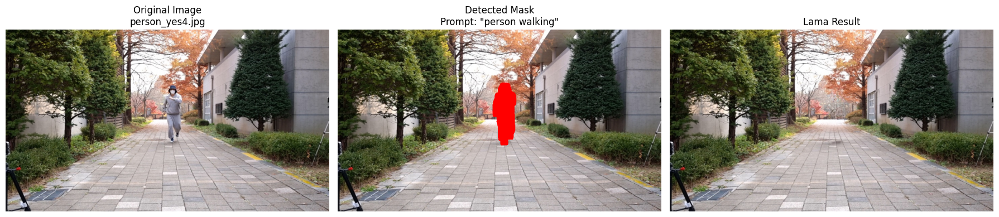

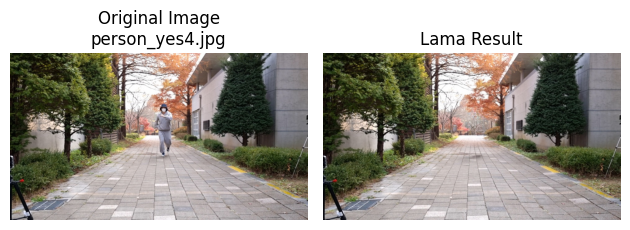

In [31]:
# result = test_single_image_standalone_fixed(
#     '/content/drive/MyDrive/Magia/multiple_people1.jpg',
#     'person in the back',  # what to remove
#     method='lama'  # or 'stable_diffusion'
# )

result = test_single_image_standalone_fixed(
    '/content/drive/MyDrive/RORD/person/person_yes4.jpg',
    'person walking',  # what to remove
    method='lama'  # or 'stable_diffusion'
)

## Models testing and comparison

In [33]:
# Compare both
results_lama = evaluate_custom_dataset(method="lama")

Using inpainting method: lama
Found object folders: ['car', 'person_scooter', 'dog', 'forklift', 'boat', 'person', 'cat']
Found pair: prompt='black car', id=1, method=lama
Found pair: prompt='car', id=2, method=lama
Found pair: prompt='car', id=3, method=lama
Found pair: prompt='car', id=4, method=lama
Found pair: prompt='car', id=9, method=lama
Found pair: prompt='car', id=10, method=lama
Found pair: prompt='black suv', id=5, method=lama
Found pair: prompt='black suv', id=7, method=lama
Found pair: prompt='black suv', id=8, method=lama
car: 9 pairs found
Found pair: prompt='person scooter', id=1, method=lama
Found pair: prompt='person on scooter', id=3, method=lama
Found pair: prompt='person on scooter', id=4, method=lama
person_scooter: 3 pairs found
Found pair: prompt='dog person', id=1, method=lama
Found pair: prompt='dog person', id=2, method=lama
dog: 2 pairs found
Found pair: prompt='forklift', id=1, method=lama
Found pair: prompt='forklift', id=2, method=lama
Found pair: prompt

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 227MB/s]
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed

Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 142MB/s]


Running evaluation...

 Processing folder 'car' (9 pairs)


Processing car:   0%|          | 0/9 [00:00<?, ?it/s]

Processing lama inpainting for: black car_yes1.jpg
Using prompt: 'black car' for image: black car_yes1.jpg
Using method: lama


/usr/local/lib/python3.11/dist-packages/transformers/modeling_utils.py:1731: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/_dynamo/eval_frame.py:745: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/checkpoint.py:87: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
/content/GroundingDINO/groundingdino/models/GroundingDINO/transformer.py:862: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocas

Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/car/black car_inpainted_lama1.jpg


Processing car:  11%|█         | 1/9 [00:17<02:16, 17.11s/it]

Processed 'black car' (ID: 1) - PSNR: 15.84, SSIM: 0.7490
Processing lama inpainting for: car_yes2.jpg
Using prompt: 'car' for image: car_yes2.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/car/car_inpainted_lama2.jpg


Processing car:  22%|██▏       | 2/9 [00:33<01:57, 16.81s/it]

Processed 'car' (ID: 2) - PSNR: 16.61, SSIM: 0.6635
Processing lama inpainting for: car_yes3.jpg
Using prompt: 'car' for image: car_yes3.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/car/car_inpainted_lama3.jpg


Processing car:  33%|███▎      | 3/9 [00:50<01:41, 16.88s/it]

Processed 'car' (ID: 3) - PSNR: 17.89, SSIM: 0.6200
Processing lama inpainting for: car_yes4.jpg
Using prompt: 'car' for image: car_yes4.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/car/car_inpainted_lama4.jpg


Processing car:  44%|████▍     | 4/9 [01:07<01:24, 16.95s/it]

Processed 'car' (ID: 4) - PSNR: 20.61, SSIM: 0.8493
Processing lama inpainting for: car_yes9.jpg
Using prompt: 'car' for image: car_yes9.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/car/car_inpainted_lama9.jpg


Processing car:  56%|█████▌    | 5/9 [01:24<01:07, 16.84s/it]

Processed 'car' (ID: 9) - PSNR: 22.59, SSIM: 0.8694
Processing lama inpainting for: car_yes10.jpg
Using prompt: 'car' for image: car_yes10.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/car/car_inpainted_lama10.jpg


Processing car:  67%|██████▋   | 6/9 [01:40<00:50, 16.73s/it]

Processed 'car' (ID: 10) - PSNR: 17.60, SSIM: 0.5324
Processing lama inpainting for: black suv_yes5.jpg
Using prompt: 'black suv' for image: black suv_yes5.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/car/black suv_inpainted_lama5.jpg


Processing car:  78%|███████▊  | 7/9 [01:58<00:33, 16.98s/it]

Processed 'black suv' (ID: 5) - PSNR: 14.86, SSIM: 0.7189
Processing lama inpainting for: black suv_yes7.jpg
Using prompt: 'black suv' for image: black suv_yes7.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/car/black suv_inpainted_lama7.jpg


Processing car:  89%|████████▉ | 8/9 [02:15<00:16, 16.90s/it]

Processed 'black suv' (ID: 7) - PSNR: 27.50, SSIM: 0.9090
Processing lama inpainting for: black suv_yes8.jpg
Using prompt: 'black suv' for image: black suv_yes8.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/car/black suv_inpainted_lama8.jpg


Processing car: 100%|██████████| 9/9 [02:31<00:00, 16.83s/it]


Processed 'black suv' (ID: 8) - PSNR: 19.44, SSIM: 0.8005
car: 9 successful
PSNR: 19.22
SSIM: 0.7458
LPIPS: 0.1713

 Processing folder 'person_scooter' (3 pairs)


Processing person_scooter:   0%|          | 0/3 [00:00<?, ?it/s]

Processing lama inpainting for: person scooter_yes1.jpg
Using prompt: 'person scooter' for image: person scooter_yes1.jpg
Using method: lama
Detected 2 objects
Saved lama result to: /content/drive/MyDrive/RORD/person_scooter/person scooter_inpainted_lama1.jpg


Processing person_scooter:  33%|███▎      | 1/3 [00:16<00:32, 16.32s/it]

Processed 'person scooter' (ID: 1) - PSNR: 31.03, SSIM: 0.9151
Processing lama inpainting for: person on scooter_yes3.jpg
Using prompt: 'person on scooter' for image: person on scooter_yes3.jpg
Using method: lama
Detected 2 objects
Saved lama result to: /content/drive/MyDrive/RORD/person_scooter/person on scooter_inpainted_lama3.jpg


Processing person_scooter:  67%|██████▋   | 2/3 [00:32<00:16, 16.32s/it]

Processed 'person on scooter' (ID: 3) - PSNR: 20.88, SSIM: 0.8837
Processing lama inpainting for: person on scooter_yes4.jpg
Using prompt: 'person on scooter' for image: person on scooter_yes4.jpg
Using method: lama
Detected 2 objects
Saved lama result to: /content/drive/MyDrive/RORD/person_scooter/person on scooter_inpainted_lama4.jpg


Processing person_scooter: 100%|██████████| 3/3 [00:49<00:00, 16.49s/it]


Processed 'person on scooter' (ID: 4) - PSNR: 19.09, SSIM: 0.8673
person_scooter: 3 successful
PSNR: 23.67
SSIM: 0.8887
LPIPS: 0.0858

 Processing folder 'dog' (2 pairs)


Processing dog:   0%|          | 0/2 [00:00<?, ?it/s]

Processing lama inpainting for: dog person_yes1.jpg
Using prompt: 'dog person' for image: dog person_yes1.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/dog/dog person_inpainted_lama1.jpg


Processing dog:  50%|█████     | 1/2 [00:16<00:16, 16.21s/it]

Processed 'dog person' (ID: 1) - PSNR: 14.57, SSIM: 0.8121
Processing lama inpainting for: dog person_yes2.jpg
Using prompt: 'dog person' for image: dog person_yes2.jpg
Using method: lama
Detected 2 objects
Saved lama result to: /content/drive/MyDrive/RORD/dog/dog person_inpainted_lama2.jpg


Processing dog: 100%|██████████| 2/2 [00:32<00:00, 16.36s/it]


Processed 'dog person' (ID: 2) - PSNR: 16.40, SSIM: 0.7006
dog: 2 successful
PSNR: 15.49
SSIM: 0.7563
LPIPS: 0.2159

 Processing folder 'forklift' (4 pairs)


Processing forklift:   0%|          | 0/4 [00:00<?, ?it/s]

Processing lama inpainting for: forklift_yes1.jpg
Using prompt: 'forklift' for image: forklift_yes1.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/forklift/forklift_inpainted_lama1.jpg


Processing forklift:  25%|██▌       | 1/4 [00:17<00:51, 17.15s/it]

Processed 'forklift' (ID: 1) - PSNR: 29.51, SSIM: 0.9246
Processing lama inpainting for: forklift_yes2.jpg
Using prompt: 'forklift' for image: forklift_yes2.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/forklift/forklift_inpainted_lama2.jpg


Processing forklift:  50%|█████     | 2/4 [00:33<00:33, 16.82s/it]

Processed 'forklift' (ID: 2) - PSNR: 25.88, SSIM: 0.8442
Processing lama inpainting for: forklift_yes4.jpg
Using prompt: 'forklift' for image: forklift_yes4.jpg
Using method: lama
Detected 2 objects
Saved lama result to: /content/drive/MyDrive/RORD/forklift/forklift_inpainted_lama4.jpg


Processing forklift:  75%|███████▌  | 3/4 [00:49<00:16, 16.44s/it]

Processed 'forklift' (ID: 4) - PSNR: 19.58, SSIM: 0.7989
Processing lama inpainting for: forklift person_yes3.jpg
Using prompt: 'forklift person' for image: forklift person_yes3.jpg
Using method: lama
Detected 2 objects
Saved lama result to: /content/drive/MyDrive/RORD/forklift/forklift person_inpainted_lama3.jpg


Processing forklift: 100%|██████████| 4/4 [01:06<00:00, 16.75s/it]


Processed 'forklift person' (ID: 3) - PSNR: 24.97, SSIM: 0.8607
forklift: 4 successful
PSNR: 24.99
SSIM: 0.8571
LPIPS: 0.1140

 Processing folder 'boat' (2 pairs)


Processing boat:   0%|          | 0/2 [00:00<?, ?it/s]

Processing lama inpainting for: boat_yes1.jpg
Using prompt: 'boat' for image: boat_yes1.jpg
Using method: lama
Detected 4 objects
Saved lama result to: /content/drive/MyDrive/RORD/boat/boat_inpainted_lama1.jpg


Processing boat:  50%|█████     | 1/2 [00:16<00:16, 16.10s/it]

Processed 'boat' (ID: 1) - PSNR: 15.55, SSIM: 0.5851
Processing lama inpainting for: boat_yes2.jpg
Using prompt: 'boat' for image: boat_yes2.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/boat/boat_inpainted_lama2.jpg


Processing boat: 100%|██████████| 2/2 [00:32<00:00, 16.22s/it]


Processed 'boat' (ID: 2) - PSNR: 19.80, SSIM: 0.2707
boat: 2 successful
PSNR: 17.68
SSIM: 0.4279
LPIPS: 0.2751

 Processing folder 'person' (24 pairs)


Processing person:   0%|          | 0/24 [00:00<?, ?it/s]

Processing lama inpainting for: person_yes3.jpg
Using prompt: 'person' for image: person_yes3.jpg
Using method: lama
Detected 6 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama3.jpg


Processing person:   4%|▍         | 1/24 [00:17<06:42, 17.52s/it]

Processed 'person' (ID: 3) - PSNR: 24.02, SSIM: 0.9235
Processing lama inpainting for: person_yes1.jpg
Using prompt: 'person' for image: person_yes1.jpg
Using method: lama
Detected 2 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama1.jpg


Processing person:   8%|▊         | 2/24 [00:35<06:25, 17.54s/it]

Processed 'person' (ID: 1) - PSNR: 26.42, SSIM: 0.9317
Processing lama inpainting for: person_yes2.jpg
Using prompt: 'person' for image: person_yes2.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama2.jpg


Processing person:  12%|█▎        | 3/24 [00:51<05:56, 16.96s/it]

Processed 'person' (ID: 2) - PSNR: 23.60, SSIM: 0.9324
Processing lama inpainting for: person_yes11.jpg
Using prompt: 'person' for image: person_yes11.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama11.jpg


Processing person:  17%|█▋        | 4/24 [01:08<05:40, 17.02s/it]

Processed 'person' (ID: 11) - PSNR: 19.01, SSIM: 0.7883
Processing lama inpainting for: person_yes24.jpg
Using prompt: 'person' for image: person_yes24.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama24.jpg


Processing person:  21%|██        | 5/24 [01:24<05:19, 16.83s/it]

Processed 'person' (ID: 24) - PSNR: 29.55, SSIM: 0.9383
Processing lama inpainting for: person_yes23.jpg
Using prompt: 'person' for image: person_yes23.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama23.jpg


Processing person:  25%|██▌       | 6/24 [01:41<04:58, 16.57s/it]

Processed 'person' (ID: 23) - PSNR: 35.31, SSIM: 0.9764
Processing lama inpainting for: person_yes22.jpg
Using prompt: 'person' for image: person_yes22.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama22.jpg


Processing person:  29%|██▉       | 7/24 [01:58<04:45, 16.77s/it]

Processed 'person' (ID: 22) - PSNR: 20.93, SSIM: 0.8384
Processing lama inpainting for: person_yes21.jpg
Using prompt: 'person' for image: person_yes21.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama21.jpg


Processing person:  33%|███▎      | 8/24 [02:14<04:27, 16.75s/it]

Processed 'person' (ID: 21) - PSNR: 31.87, SSIM: 0.9406
Processing lama inpainting for: person_yes20.jpg
Using prompt: 'person' for image: person_yes20.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama20.jpg


Processing person:  38%|███▊      | 9/24 [02:31<04:12, 16.84s/it]

Processed 'person' (ID: 20) - PSNR: 27.69, SSIM: 0.9357
Processing lama inpainting for: person_yes19.jpg
Using prompt: 'person' for image: person_yes19.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama19.jpg


Processing person:  42%|████▏     | 10/24 [02:48<03:53, 16.69s/it]

Processed 'person' (ID: 19) - PSNR: 27.44, SSIM: 0.9503
Processing lama inpainting for: person_yes4.jpg
Using prompt: 'person' for image: person_yes4.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama4.jpg


Processing person:  46%|████▌     | 11/24 [03:04<03:34, 16.46s/it]

Processed 'person' (ID: 4) - PSNR: 26.30, SSIM: 0.9355
Processing lama inpainting for: person_yes5.jpg
Using prompt: 'person' for image: person_yes5.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama5.jpg


Processing person:  50%|█████     | 12/24 [03:22<03:23, 16.95s/it]

Processed 'person' (ID: 5) - PSNR: 18.63, SSIM: 0.7090
Processing lama inpainting for: person_yes6.jpg
Using prompt: 'person' for image: person_yes6.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama6.jpg


Processing person:  54%|█████▍    | 13/24 [03:39<03:05, 16.88s/it]

Processed 'person' (ID: 6) - PSNR: 18.24, SSIM: 0.7318
Processing lama inpainting for: person_yes7.jpg
Using prompt: 'person' for image: person_yes7.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama7.jpg


Processing person:  58%|█████▊    | 14/24 [03:55<02:47, 16.76s/it]

Processed 'person' (ID: 7) - PSNR: 18.71, SSIM: 0.8363
Processing lama inpainting for: person_yes8.jpg
Using prompt: 'person' for image: person_yes8.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama8.jpg


Processing person:  62%|██████▎   | 15/24 [04:12<02:32, 16.93s/it]

Processed 'person' (ID: 8) - PSNR: 27.32, SSIM: 0.9104
Processing lama inpainting for: person_yes9.jpg
Using prompt: 'person' for image: person_yes9.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama9.jpg


Processing person:  67%|██████▋   | 16/24 [04:29<02:13, 16.72s/it]

Processed 'person' (ID: 9) - PSNR: 20.95, SSIM: 0.8022
Processing lama inpainting for: person_yes10.jpg
Using prompt: 'person' for image: person_yes10.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama10.jpg


Processing person:  71%|███████   | 17/24 [04:45<01:56, 16.68s/it]

Processed 'person' (ID: 10) - PSNR: 20.33, SSIM: 0.8080
Processing lama inpainting for: person_yes12.jpg
Using prompt: 'person' for image: person_yes12.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama12.jpg


Processing person:  75%|███████▌  | 18/24 [05:02<01:40, 16.70s/it]

Processed 'person' (ID: 12) - PSNR: 17.90, SSIM: 0.6413
Processing lama inpainting for: person_yes13.jpg
Using prompt: 'person' for image: person_yes13.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama13.jpg


Processing person:  79%|███████▉  | 19/24 [05:18<01:22, 16.59s/it]

Processed 'person' (ID: 13) - PSNR: 27.70, SSIM: 0.9472
Processing lama inpainting for: person_yes14.jpg
Using prompt: 'person' for image: person_yes14.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama14.jpg


Processing person:  83%|████████▎ | 20/24 [05:35<01:06, 16.73s/it]

Processed 'person' (ID: 14) - PSNR: 24.51, SSIM: 0.9081
Processing lama inpainting for: person_yes15.jpg
Using prompt: 'person' for image: person_yes15.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama15.jpg


Processing person:  88%|████████▊ | 21/24 [05:51<00:49, 16.45s/it]

Processed 'person' (ID: 15) - PSNR: 25.04, SSIM: 0.9183
Processing lama inpainting for: person reflection_yes16.jpg
Using prompt: 'person reflection' for image: person reflection_yes16.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person reflection_inpainted_lama16.jpg


Processing person:  92%|█████████▏| 22/24 [06:07<00:32, 16.36s/it]

Processed 'person reflection' (ID: 16) - PSNR: 18.26, SSIM: 0.8725
Processing lama inpainting for: person_yes17.jpg
Using prompt: 'person' for image: person_yes17.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama17.jpg


Processing person:  96%|█████████▌| 23/24 [06:26<00:17, 17.00s/it]

Processed 'person' (ID: 17) - PSNR: 25.99, SSIM: 0.7500
Processing lama inpainting for: person_yes18.jpg
Using prompt: 'person' for image: person_yes18.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/person/person_inpainted_lama18.jpg


Processing person: 100%|██████████| 24/24 [06:42<00:00, 16.76s/it]


Processed 'person' (ID: 18) - PSNR: 23.54, SSIM: 0.8268
person: 24 successful
PSNR: 24.14
SSIM: 0.8647
LPIPS: 0.0828

 Processing folder 'cat' (6 pairs)


Processing cat:   0%|          | 0/6 [00:00<?, ?it/s]

Processing lama inpainting for: cat_yes6.jpg
Using prompt: 'cat' for image: cat_yes6.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_lama6.jpg


Processing cat:  17%|█▋        | 1/6 [00:16<01:21, 16.36s/it]

Processed 'cat' (ID: 6) - PSNR: 32.55, SSIM: 0.9664
Processing lama inpainting for: cat_yes1.jpg
Using prompt: 'cat' for image: cat_yes1.jpg
Using method: lama
Detected 3 objects
Saved lama result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_lama1.jpg


Processing cat:  33%|███▎      | 2/6 [00:33<01:08, 17.06s/it]

Processed 'cat' (ID: 1) - PSNR: 20.63, SSIM: 0.8256
Processing lama inpainting for: cat_yes2.jpg
Using prompt: 'cat' for image: cat_yes2.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_lama2.jpg


Processing cat:  50%|█████     | 3/6 [00:49<00:49, 16.49s/it]

Processed 'cat' (ID: 2) - PSNR: 29.72, SSIM: 0.9450
Processing lama inpainting for: cat_yes3.jpg
Using prompt: 'cat' for image: cat_yes3.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_lama3.jpg


Processing cat:  67%|██████▋   | 4/6 [01:06<00:32, 16.47s/it]

Processed 'cat' (ID: 3) - PSNR: 22.46, SSIM: 0.8579
Processing lama inpainting for: cat_yes4.jpg
Using prompt: 'cat' for image: cat_yes4.jpg
Using method: lama
Detected 1 objects
Saved lama result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_lama4.jpg


Processing cat:  83%|████████▎ | 5/6 [01:23<00:16, 16.85s/it]

Processed 'cat' (ID: 4) - PSNR: 22.68, SSIM: 0.8034
Processing lama inpainting for: cat_yes5.jpg
Using prompt: 'cat' for image: cat_yes5.jpg
Using method: lama
Detected 2 objects
Saved lama result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_lama5.jpg


Processing cat: 100%|██████████| 6/6 [01:40<00:00, 16.75s/it]

Processed 'cat' (ID: 5) - PSNR: 21.62, SSIM: 0.8379
cat: 6 successful
PSNR: 24.94
SSIM: 0.8727
LPIPS: 0.0863



EVALUATION RESULTS - LAMA
Overall Results (50/50 successful):
PSNR: 22.78 ± 5.02
SSIM: 0.8233 ± 0.1303
LPIPS: 0.1149 ± 0.0755
FID: 45.95

Per-folder breakdown:
  car: PSNR=19.22, SSIM=0.7458, LPIPS=0.1713 (9 samples)
  person_scooter: PSNR=23.67, SSIM=0.8887, LPIPS=0.0858 (3 samples)
  dog: PSNR=15.49, SSIM=0.7563, LPIPS=0.2159 (2 samples)
  forklift: PSNR=24.99, SSIM=0.8571, LPIPS=0.1140 (4 samples)
  boat: PSNR=17.68, SSIM=0.4279, LPIPS=0.2751 (2 samples)
  person: PSNR=24.14, SSIM=0.8647, LPIPS=0.0828 (24 samples)
  cat: PSNR=24.94, SSIM=0.8727, LPIPS=0.0863 (6 samples)

Per-prompt breakdown:
  'black car': PSNR=15.84, SSIM=0.7490, LPIPS=0.2075 (1 samples)
  'car': PSNR=19.06, SSIM=0.7069, LPIPS=0.1921 (5 samples)
  'black suv': PSNR=20.60, SSIM=0.8095, LPIPS=0.1245 (3 samples)
  'person scooter': PSNR=31.03, SSIM=0.9151, LPIPS=0.0671 (1 samples)
  'person on scooter': PSNR=19.99, SSIM=0.8755, LPIPS=0.0952 (2 samples)
  'dog person': PSNR=15.49, SSIM=0.7563, LPIPS=0.2159 (2 samples

Ranking by: PSNR (↑ better)


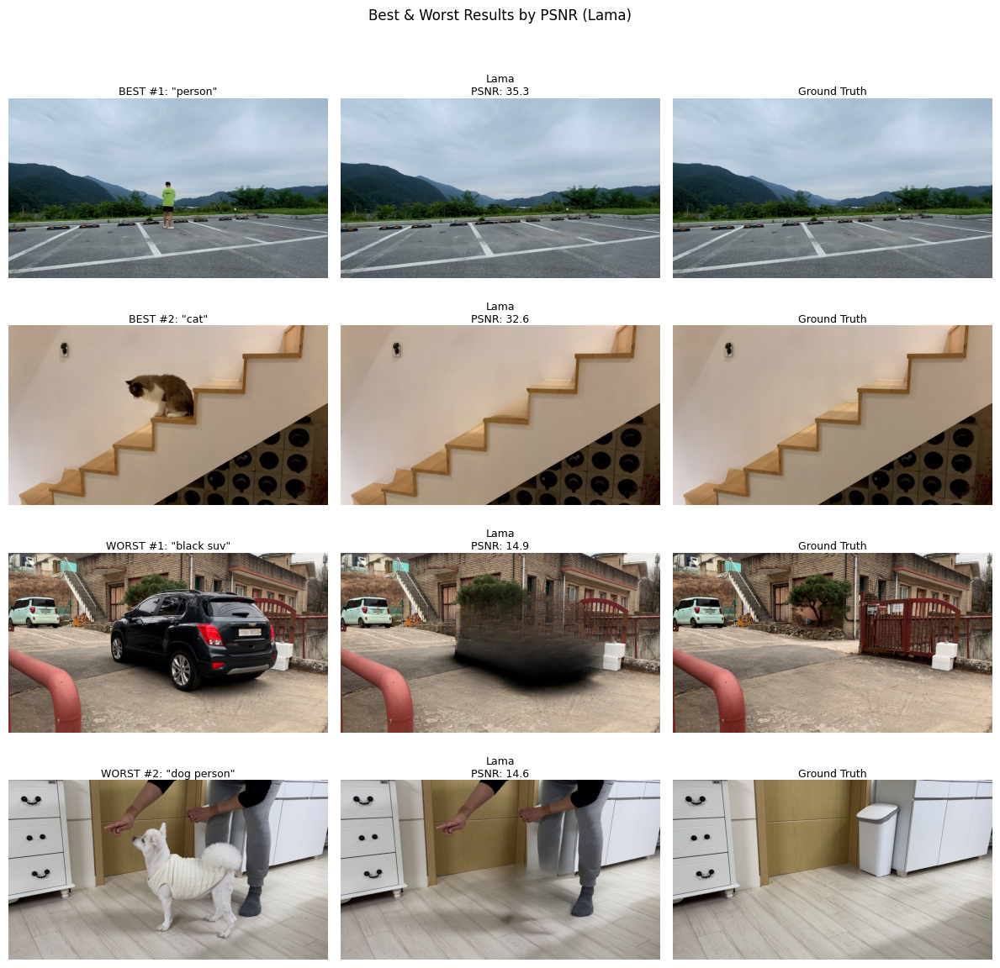


 Summary:
Best PSNR: 35.3
Worst PSNR: 14.6
Ranking by: SSIM (↑ better)


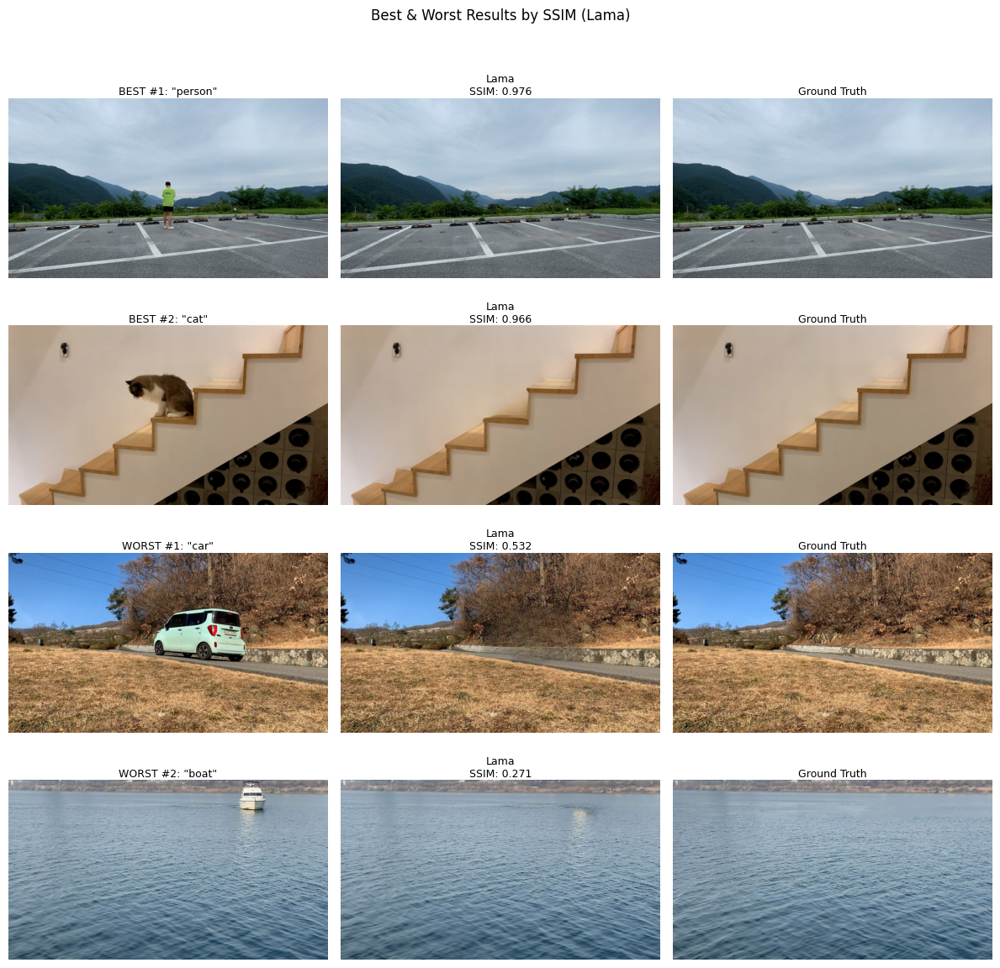


 Summary:
Best SSIM: 0.976
Worst SSIM: 0.271
Ranking by: LPIPS (↓ better)


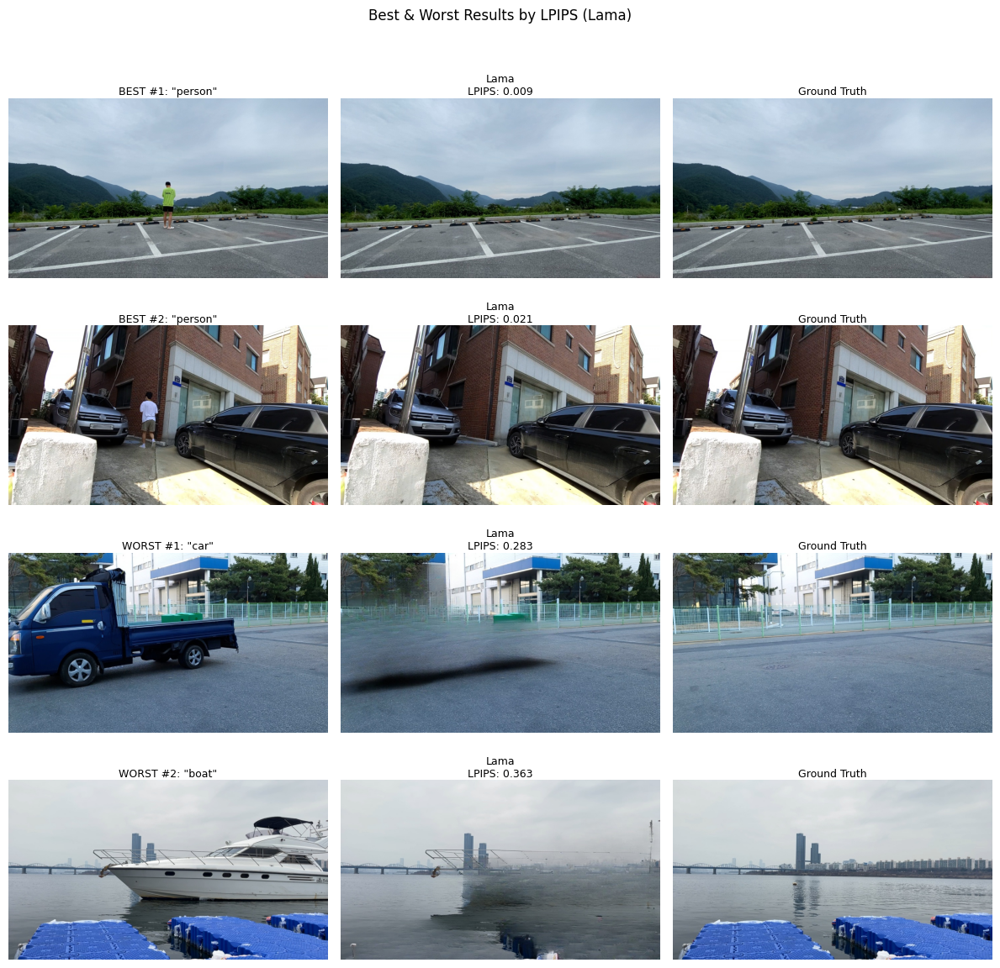


 Summary:
Best LPIPS: 0.009
Worst LPIPS: 0.363


In [35]:
show_best_worst_results(results_lama, sort_by='psnr', num_best=2, num_worst=2, method="lama")
show_best_worst_results(results_lama, sort_by='ssim', num_best=2, num_worst=2, method="lama")
show_best_worst_results(results_lama, sort_by='lpips', num_best=2, num_worst=2, method="lama")

In [36]:
results_sd = evaluate_custom_dataset(method="sd", pipe=pipe)

Using inpainting method: sd
Found object folders: ['car', 'person_scooter', 'dog', 'forklift', 'boat', 'person', 'cat']
Found pair: prompt='black car', id=1, method=sd
Found pair: prompt='car', id=2, method=sd
Found pair: prompt='car', id=3, method=sd
Found pair: prompt='car', id=4, method=sd
Found pair: prompt='car', id=9, method=sd
Found pair: prompt='car', id=10, method=sd
Found pair: prompt='black suv', id=5, method=sd
Found pair: prompt='black suv', id=7, method=sd
Found pair: prompt='black suv', id=8, method=sd
car: 9 pairs found
Found pair: prompt='person scooter', id=1, method=sd
Found pair: prompt='person on scooter', id=3, method=sd
Found pair: prompt='person on scooter', id=4, method=sd
person_scooter: 3 pairs found
Found pair: prompt='dog person', id=1, method=sd
Found pair: prompt='dog person', id=2, method=sd
dog: 2 pairs found
Found pair: prompt='forklift', id=1, method=sd
Found pair: prompt='forklift', id=2, method=sd
Found pair: prompt='forklift', id=4, method=sd
Found

Processing car:   0%|          | 0/9 [00:00<?, ?it/s]

Processing sd inpainting for: black car_yes1.jpg
Using prompt: 'black car' for image: black car_yes1.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without black car, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing car:  11%|█         | 1/9 [00:07<00:56,  7.02s/it]

Saved sd result to: /content/drive/MyDrive/RORD/car/black car_inpainted_sd1.jpg
Processed 'black car' (ID: 1) - PSNR: 15.81, SSIM: 0.7135
Processing sd inpainting for: car_yes2.jpg
Using prompt: 'car' for image: car_yes2.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without car, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing car:  22%|██▏       | 2/9 [00:14<00:49,  7.03s/it]

Saved sd result to: /content/drive/MyDrive/RORD/car/car_inpainted_sd2.jpg
Processed 'car' (ID: 2) - PSNR: 11.78, SSIM: 0.3406
Processing sd inpainting for: car_yes3.jpg
Using prompt: 'car' for image: car_yes3.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without car, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing car:  33%|███▎      | 3/9 [00:21<00:42,  7.03s/it]

Saved sd result to: /content/drive/MyDrive/RORD/car/car_inpainted_sd3.jpg
Processed 'car' (ID: 3) - PSNR: 12.17, SSIM: 0.3258
Processing sd inpainting for: car_yes4.jpg
Using prompt: 'car' for image: car_yes4.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without car, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing car:  44%|████▍     | 4/9 [00:27<00:34,  6.94s/it]

Saved sd result to: /content/drive/MyDrive/RORD/car/car_inpainted_sd4.jpg
Processed 'car' (ID: 4) - PSNR: 18.28, SSIM: 0.7287
Processing sd inpainting for: car_yes9.jpg
Using prompt: 'car' for image: car_yes9.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without car, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing car:  56%|█████▌    | 5/9 [00:34<00:27,  6.83s/it]

Saved sd result to: /content/drive/MyDrive/RORD/car/car_inpainted_sd9.jpg
Processed 'car' (ID: 9) - PSNR: 18.32, SSIM: 0.2928
Processing sd inpainting for: car_yes10.jpg
Using prompt: 'car' for image: car_yes10.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without car, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing car:  67%|██████▋   | 6/9 [00:41<00:20,  6.76s/it]

Saved sd result to: /content/drive/MyDrive/RORD/car/car_inpainted_sd10.jpg
Processed 'car' (ID: 10) - PSNR: 16.97, SSIM: 0.2939
Processing sd inpainting for: black suv_yes5.jpg
Using prompt: 'black suv' for image: black suv_yes5.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without black suv, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing car:  78%|███████▊  | 7/9 [00:47<00:13,  6.76s/it]

Saved sd result to: /content/drive/MyDrive/RORD/car/black suv_inpainted_sd5.jpg
Processed 'black suv' (ID: 5) - PSNR: 12.89, SSIM: 0.3891
Processing sd inpainting for: black suv_yes7.jpg
Using prompt: 'black suv' for image: black suv_yes7.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without black suv, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing car:  89%|████████▉ | 8/9 [00:54<00:06,  6.67s/it]

Saved sd result to: /content/drive/MyDrive/RORD/car/black suv_inpainted_sd7.jpg
Processed 'black suv' (ID: 7) - PSNR: 19.88, SSIM: 0.4777
Processing sd inpainting for: black suv_yes8.jpg
Using prompt: 'black suv' for image: black suv_yes8.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without black suv, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing car: 100%|██████████| 9/9 [01:00<00:00,  6.76s/it]


Saved sd result to: /content/drive/MyDrive/RORD/car/black suv_inpainted_sd8.jpg
Processed 'black suv' (ID: 8) - PSNR: 17.33, SSIM: 0.5003
car: 9 successful
PSNR: 15.94
SSIM: 0.4514
LPIPS: 0.4335

 Processing folder 'person_scooter' (3 pairs)


Processing person_scooter:   0%|          | 0/3 [00:00<?, ?it/s]

Processing sd inpainting for: person scooter_yes1.jpg
Using prompt: 'person scooter' for image: person scooter_yes1.jpg
Using method: sd
Detected 2 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person scooter, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person_scooter:  33%|███▎      | 1/3 [00:06<00:12,  6.50s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person_scooter/person scooter_inpainted_sd1.jpg
Processed 'person scooter' (ID: 1) - PSNR: 26.48, SSIM: 0.7515
Processing sd inpainting for: person on scooter_yes3.jpg
Using prompt: 'person on scooter' for image: person on scooter_yes3.jpg
Using method: sd
Detected 2 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person on scooter, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person_scooter:  67%|██████▋   | 2/3 [00:12<00:06,  6.45s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person_scooter/person on scooter_inpainted_sd3.jpg
Processed 'person on scooter' (ID: 3) - PSNR: 16.27, SSIM: 0.7459
Processing sd inpainting for: person on scooter_yes4.jpg
Using prompt: 'person on scooter' for image: person on scooter_yes4.jpg
Using method: sd
Detected 2 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person on scooter, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person_scooter: 100%|██████████| 3/3 [00:19<00:00,  6.47s/it]


Saved sd result to: /content/drive/MyDrive/RORD/person_scooter/person on scooter_inpainted_sd4.jpg
Processed 'person on scooter' (ID: 4) - PSNR: 15.13, SSIM: 0.6032
person_scooter: 3 successful
PSNR: 19.29
SSIM: 0.7002
LPIPS: 0.2588

 Processing folder 'dog' (2 pairs)


Processing dog:   0%|          | 0/2 [00:00<?, ?it/s]

Processing sd inpainting for: dog person_yes1.jpg
Using prompt: 'dog person' for image: dog person_yes1.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without dog person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing dog:  50%|█████     | 1/2 [00:06<00:06,  6.58s/it]

Saved sd result to: /content/drive/MyDrive/RORD/dog/dog person_inpainted_sd1.jpg
Processed 'dog person' (ID: 1) - PSNR: 13.84, SSIM: 0.7197
Processing sd inpainting for: dog person_yes2.jpg
Using prompt: 'dog person' for image: dog person_yes2.jpg
Using method: sd
Detected 2 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without dog person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing dog: 100%|██████████| 2/2 [00:13<00:00,  6.58s/it]


Saved sd result to: /content/drive/MyDrive/RORD/dog/dog person_inpainted_sd2.jpg
Processed 'dog person' (ID: 2) - PSNR: 13.95, SSIM: 0.3093
dog: 2 successful
PSNR: 13.90
SSIM: 0.5145
LPIPS: 0.4427

 Processing folder 'forklift' (4 pairs)


Processing forklift:   0%|          | 0/4 [00:00<?, ?it/s]

Processing sd inpainting for: forklift_yes1.jpg
Using prompt: 'forklift' for image: forklift_yes1.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without forklift, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing forklift:  25%|██▌       | 1/4 [00:06<00:20,  6.70s/it]

Saved sd result to: /content/drive/MyDrive/RORD/forklift/forklift_inpainted_sd1.jpg
Processed 'forklift' (ID: 1) - PSNR: 19.27, SSIM: 0.3263
Processing sd inpainting for: forklift_yes2.jpg
Using prompt: 'forklift' for image: forklift_yes2.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without forklift, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing forklift:  50%|█████     | 2/4 [00:13<00:13,  6.78s/it]

Saved sd result to: /content/drive/MyDrive/RORD/forklift/forklift_inpainted_sd2.jpg
Processed 'forklift' (ID: 2) - PSNR: 16.15, SSIM: 0.5375
Processing sd inpainting for: forklift_yes4.jpg
Using prompt: 'forklift' for image: forklift_yes4.jpg
Using method: sd
Detected 2 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without forklift, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing forklift:  75%|███████▌  | 3/4 [00:20<00:06,  6.73s/it]

Saved sd result to: /content/drive/MyDrive/RORD/forklift/forklift_inpainted_sd4.jpg
Processed 'forklift' (ID: 4) - PSNR: 15.71, SSIM: 0.5432
Processing sd inpainting for: forklift person_yes3.jpg
Using prompt: 'forklift person' for image: forklift person_yes3.jpg
Using method: sd
Detected 2 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without forklift person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing forklift: 100%|██████████| 4/4 [00:26<00:00,  6.74s/it]


Saved sd result to: /content/drive/MyDrive/RORD/forklift/forklift person_inpainted_sd3.jpg
Processed 'forklift person' (ID: 3) - PSNR: 16.48, SSIM: 0.5106
forklift: 4 successful
PSNR: 16.90
SSIM: 0.4794
LPIPS: 0.4460

 Processing folder 'boat' (2 pairs)


Processing boat:   0%|          | 0/2 [00:00<?, ?it/s]

Processing sd inpainting for: boat_yes1.jpg
Using prompt: 'boat' for image: boat_yes1.jpg
Using method: sd
Detected 4 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without boat, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing boat:  50%|█████     | 1/2 [00:06<00:06,  6.78s/it]

Saved sd result to: /content/drive/MyDrive/RORD/boat/boat_inpainted_sd1.jpg
Processed 'boat' (ID: 1) - PSNR: 13.71, SSIM: 0.5355
Processing sd inpainting for: boat_yes2.jpg
Using prompt: 'boat' for image: boat_yes2.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without boat, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing boat: 100%|██████████| 2/2 [00:13<00:00,  6.69s/it]


Saved sd result to: /content/drive/MyDrive/RORD/boat/boat_inpainted_sd2.jpg
Processed 'boat' (ID: 2) - PSNR: 20.54, SSIM: 0.2868
boat: 2 successful
PSNR: 17.13
SSIM: 0.4112
LPIPS: 0.3502

 Processing folder 'person' (24 pairs)


Processing person:   0%|          | 0/24 [00:00<?, ?it/s]

Processing sd inpainting for: person_yes3.jpg
Using prompt: 'person' for image: person_yes3.jpg
Using method: sd
Detected 6 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:   4%|▍         | 1/24 [00:06<02:33,  6.69s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd3.jpg
Processed 'person' (ID: 3) - PSNR: 19.06, SSIM: 0.8209
Processing sd inpainting for: person_yes1.jpg
Using prompt: 'person' for image: person_yes1.jpg
Using method: sd
Detected 2 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:   8%|▊         | 2/24 [00:13<02:26,  6.65s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd1.jpg
Processed 'person' (ID: 1) - PSNR: 17.15, SSIM: 0.3069
Processing sd inpainting for: person_yes2.jpg
Using prompt: 'person' for image: person_yes2.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  12%|█▎        | 3/24 [00:19<02:17,  6.56s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd2.jpg
Processed 'person' (ID: 2) - PSNR: 20.40, SSIM: 0.8238
Processing sd inpainting for: person_yes11.jpg
Using prompt: 'person' for image: person_yes11.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  17%|█▋        | 4/24 [00:26<02:10,  6.55s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd11.jpg
Processed 'person' (ID: 11) - PSNR: 19.47, SSIM: 0.5190
Processing sd inpainting for: person_yes24.jpg
Using prompt: 'person' for image: person_yes24.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  21%|██        | 5/24 [00:32<02:04,  6.56s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd24.jpg
Processed 'person' (ID: 24) - PSNR: 20.39, SSIM: 0.4161
Processing sd inpainting for: person_yes23.jpg
Using prompt: 'person' for image: person_yes23.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  25%|██▌       | 6/24 [00:39<01:58,  6.58s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd23.jpg
Processed 'person' (ID: 23) - PSNR: 28.16, SSIM: 0.7796
Processing sd inpainting for: person_yes22.jpg
Using prompt: 'person' for image: person_yes22.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  29%|██▉       | 7/24 [00:46<01:51,  6.58s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd22.jpg
Processed 'person' (ID: 22) - PSNR: 19.02, SSIM: 0.5500
Processing sd inpainting for: person_yes21.jpg
Using prompt: 'person' for image: person_yes21.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  33%|███▎      | 8/24 [00:52<01:44,  6.56s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd21.jpg
Processed 'person' (ID: 21) - PSNR: 23.41, SSIM: 0.6476
Processing sd inpainting for: person_yes20.jpg
Using prompt: 'person' for image: person_yes20.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  38%|███▊      | 9/24 [00:59<01:38,  6.57s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd20.jpg
Processed 'person' (ID: 20) - PSNR: 18.04, SSIM: 0.3829
Processing sd inpainting for: person_yes19.jpg
Using prompt: 'person' for image: person_yes19.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  42%|████▏     | 10/24 [01:06<01:33,  6.65s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd19.jpg
Processed 'person' (ID: 19) - PSNR: 17.16, SSIM: 0.1610
Processing sd inpainting for: person_yes4.jpg
Using prompt: 'person' for image: person_yes4.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  46%|████▌     | 11/24 [01:12<01:26,  6.68s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd4.jpg
Processed 'person' (ID: 4) - PSNR: 21.26, SSIM: 0.5268
Processing sd inpainting for: person_yes5.jpg
Using prompt: 'person' for image: person_yes5.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  50%|█████     | 12/24 [01:19<01:19,  6.64s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd5.jpg
Processed 'person' (ID: 5) - PSNR: 16.46, SSIM: 0.3359
Processing sd inpainting for: person_yes6.jpg
Using prompt: 'person' for image: person_yes6.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  54%|█████▍    | 13/24 [01:25<01:12,  6.61s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd6.jpg
Processed 'person' (ID: 6) - PSNR: 15.67, SSIM: 0.2655
Processing sd inpainting for: person_yes7.jpg
Using prompt: 'person' for image: person_yes7.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  58%|█████▊    | 14/24 [01:32<01:06,  6.62s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd7.jpg
Processed 'person' (ID: 7) - PSNR: 18.19, SSIM: 0.4842
Processing sd inpainting for: person_yes8.jpg
Using prompt: 'person' for image: person_yes8.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  62%|██████▎   | 15/24 [01:39<00:59,  6.60s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd8.jpg
Processed 'person' (ID: 8) - PSNR: 19.39, SSIM: 0.4580
Processing sd inpainting for: person_yes9.jpg
Using prompt: 'person' for image: person_yes9.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  67%|██████▋   | 16/24 [01:45<00:53,  6.63s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd9.jpg
Processed 'person' (ID: 9) - PSNR: 17.74, SSIM: 0.2837
Processing sd inpainting for: person_yes10.jpg
Using prompt: 'person' for image: person_yes10.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  71%|███████   | 17/24 [01:52<00:46,  6.64s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd10.jpg
Processed 'person' (ID: 10) - PSNR: 16.23, SSIM: 0.2558
Processing sd inpainting for: person_yes12.jpg
Using prompt: 'person' for image: person_yes12.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  75%|███████▌  | 18/24 [01:58<00:39,  6.60s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd12.jpg
Processed 'person' (ID: 12) - PSNR: 16.02, SSIM: 0.2328
Processing sd inpainting for: person_yes13.jpg
Using prompt: 'person' for image: person_yes13.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  79%|███████▉  | 19/24 [02:05<00:32,  6.57s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd13.jpg
Processed 'person' (ID: 13) - PSNR: 24.43, SSIM: 0.8337
Processing sd inpainting for: person_yes14.jpg
Using prompt: 'person' for image: person_yes14.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  83%|████████▎ | 20/24 [02:12<00:26,  6.59s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd14.jpg
Processed 'person' (ID: 14) - PSNR: 20.80, SSIM: 0.6417
Processing sd inpainting for: person_yes15.jpg
Using prompt: 'person' for image: person_yes15.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  88%|████████▊ | 21/24 [02:18<00:19,  6.58s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd15.jpg
Processed 'person' (ID: 15) - PSNR: 22.17, SSIM: 0.8825
Processing sd inpainting for: person reflection_yes16.jpg
Using prompt: 'person reflection' for image: person reflection_yes16.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person reflection, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  92%|█████████▏| 22/24 [02:25<00:13,  6.59s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person reflection_inpainted_sd16.jpg
Processed 'person reflection' (ID: 16) - PSNR: 16.32, SSIM: 0.8175
Processing sd inpainting for: person_yes17.jpg
Using prompt: 'person' for image: person_yes17.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person:  96%|█████████▌| 23/24 [02:31<00:06,  6.61s/it]

Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd17.jpg
Processed 'person' (ID: 17) - PSNR: 23.05, SSIM: 0.4506
Processing sd inpainting for: person_yes18.jpg
Using prompt: 'person' for image: person_yes18.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without person, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing person: 100%|██████████| 24/24 [02:38<00:00,  6.60s/it]


Saved sd result to: /content/drive/MyDrive/RORD/person/person_inpainted_sd18.jpg
Processed 'person' (ID: 18) - PSNR: 22.94, SSIM: 0.7783
person: 24 successful
PSNR: 19.71
SSIM: 0.5273
LPIPS: 0.3242

 Processing folder 'cat' (6 pairs)


Processing cat:   0%|          | 0/6 [00:00<?, ?it/s]

Processing sd inpainting for: cat_yes6.jpg
Using prompt: 'cat' for image: cat_yes6.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without cat, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing cat:  17%|█▋        | 1/6 [00:06<00:33,  6.62s/it]

Saved sd result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_sd6.jpg
Processed 'cat' (ID: 6) - PSNR: 33.16, SSIM: 0.9470
Processing sd inpainting for: cat_yes1.jpg
Using prompt: 'cat' for image: cat_yes1.jpg
Using method: sd
Detected 3 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without cat, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing cat:  33%|███▎      | 2/6 [00:13<00:26,  6.59s/it]

Saved sd result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_sd1.jpg
Processed 'cat' (ID: 1) - PSNR: 18.78, SSIM: 0.6123
Processing sd inpainting for: cat_yes2.jpg
Using prompt: 'cat' for image: cat_yes2.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without cat, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing cat:  50%|█████     | 3/6 [00:19<00:19,  6.58s/it]

Saved sd result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_sd2.jpg
Processed 'cat' (ID: 2) - PSNR: 22.12, SSIM: 0.8126
Processing sd inpainting for: cat_yes3.jpg
Using prompt: 'cat' for image: cat_yes3.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without cat, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing cat:  67%|██████▋   | 4/6 [00:26<00:13,  6.58s/it]

Saved sd result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_sd3.jpg
Processed 'cat' (ID: 3) - PSNR: 18.17, SSIM: 0.5230
Processing sd inpainting for: cat_yes4.jpg
Using prompt: 'cat' for image: cat_yes4.jpg
Using method: sd
Detected 1 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without cat, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing cat:  83%|████████▎ | 5/6 [00:32<00:06,  6.59s/it]

Saved sd result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_sd4.jpg
Processed 'cat' (ID: 4) - PSNR: 17.86, SSIM: 0.3569
Processing sd inpainting for: cat_yes5.jpg
Using prompt: 'cat' for image: cat_yes5.jpg
Using method: sd
Detected 2 objects
Resized from (960, 540) to (768, 432) for SD processing
SD inpainting prompt: 'scene without cat, photorealistic, high quality'


  0%|          | 0/19 [00:00<?, ?it/s]

Processing cat: 100%|██████████| 6/6 [00:39<00:00,  6.59s/it]

Saved sd result to: /content/drive/MyDrive/RORD/cat/cat_inpainted_sd5.jpg
Processed 'cat' (ID: 5) - PSNR: 18.04, SSIM: 0.3279
cat: 6 successful
PSNR: 21.35
SSIM: 0.5966
LPIPS: 0.2745



EVALUATION RESULTS - SD
Overall Results (50/50 successful):
PSNR: 18.64 ± 3.97
SSIM: 0.5233 ± 0.2044
LPIPS: 0.3495 ± 0.1424
FID: 119.24

Per-folder breakdown:
  car: PSNR=15.94, SSIM=0.4514, LPIPS=0.4335 (9 samples)
  person_scooter: PSNR=19.29, SSIM=0.7002, LPIPS=0.2588 (3 samples)
  dog: PSNR=13.90, SSIM=0.5145, LPIPS=0.4427 (2 samples)
  forklift: PSNR=16.90, SSIM=0.4794, LPIPS=0.4460 (4 samples)
  boat: PSNR=17.13, SSIM=0.4112, LPIPS=0.3502 (2 samples)
  person: PSNR=19.71, SSIM=0.5273, LPIPS=0.3242 (24 samples)
  cat: PSNR=21.35, SSIM=0.5966, LPIPS=0.2745 (6 samples)

Per-prompt breakdown:
  'black car': PSNR=15.81, SSIM=0.7135, LPIPS=0.2850 (1 samples)
  'car': PSNR=15.50, SSIM=0.3964, LPIPS=0.4960 (5 samples)
  'black suv': PSNR=16.70, SSIM=0.4557, LPIPS=0.3790 (3 samples)
  'person scooter': PSNR=26.48, SSIM=0.7515, LPIPS=0.2144 (1 samples)
  'person on scooter': PSNR=15.70, SSIM=0.6745, LPIPS=0.2810 (2 samples)
  'dog person': PSNR=13.90, SSIM=0.5145, LPIPS=0.4427 (2 samples)

Ranking by: PSNR (↑ better)


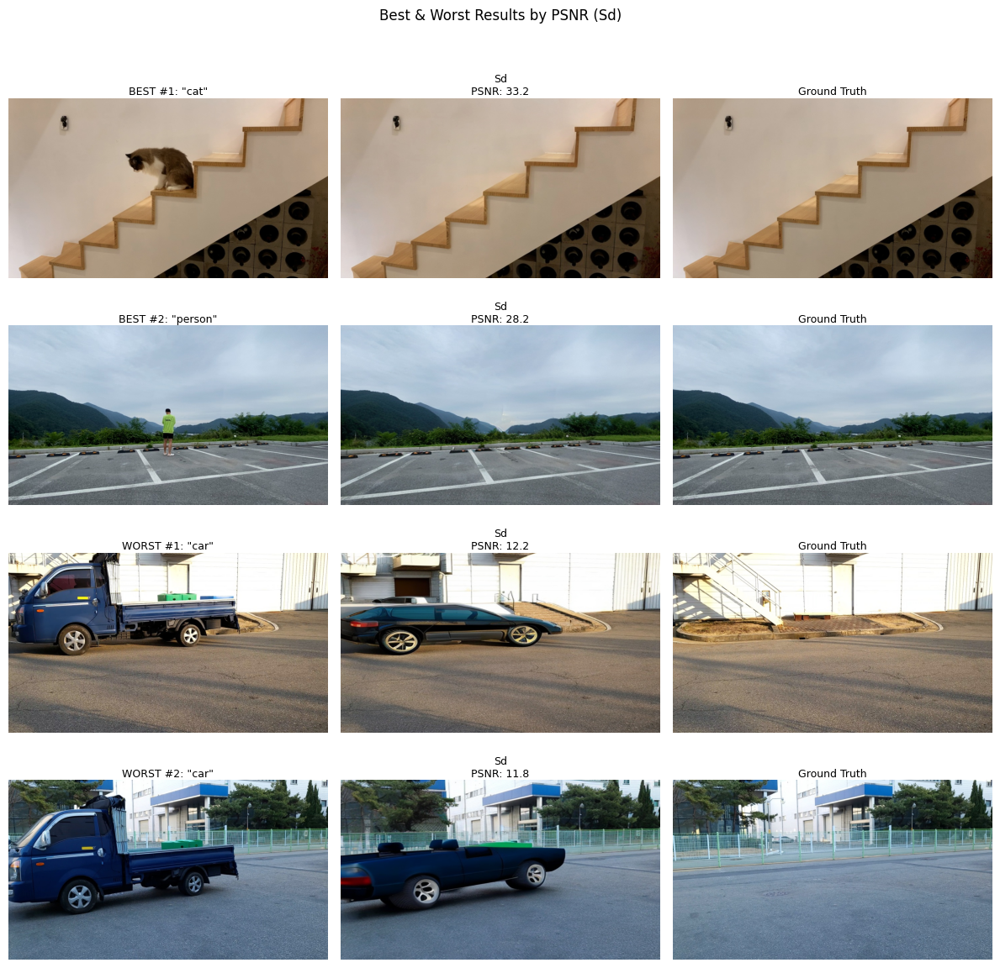


 Summary:
Best PSNR: 33.2
Worst PSNR: 11.8
Ranking by: SSIM (↑ better)


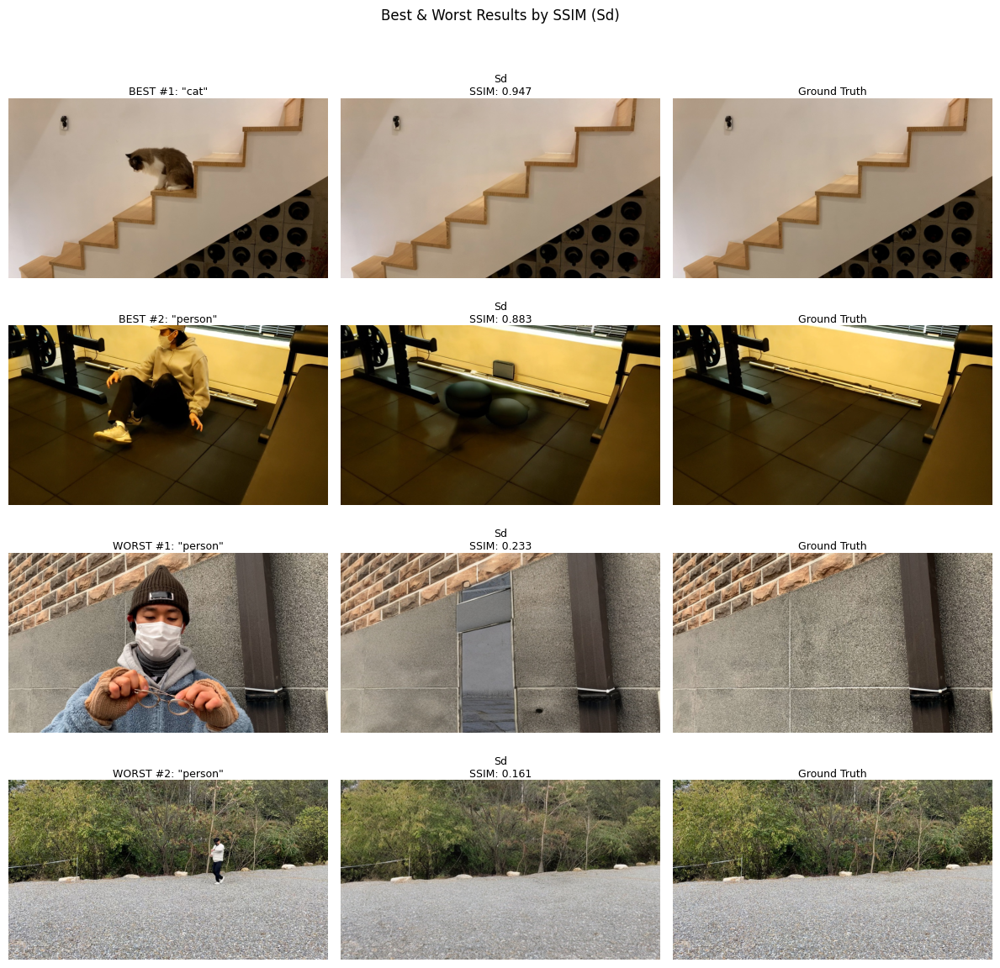


 Summary:
Best SSIM: 0.947
Worst SSIM: 0.161
Ranking by: LPIPS (↓ better)


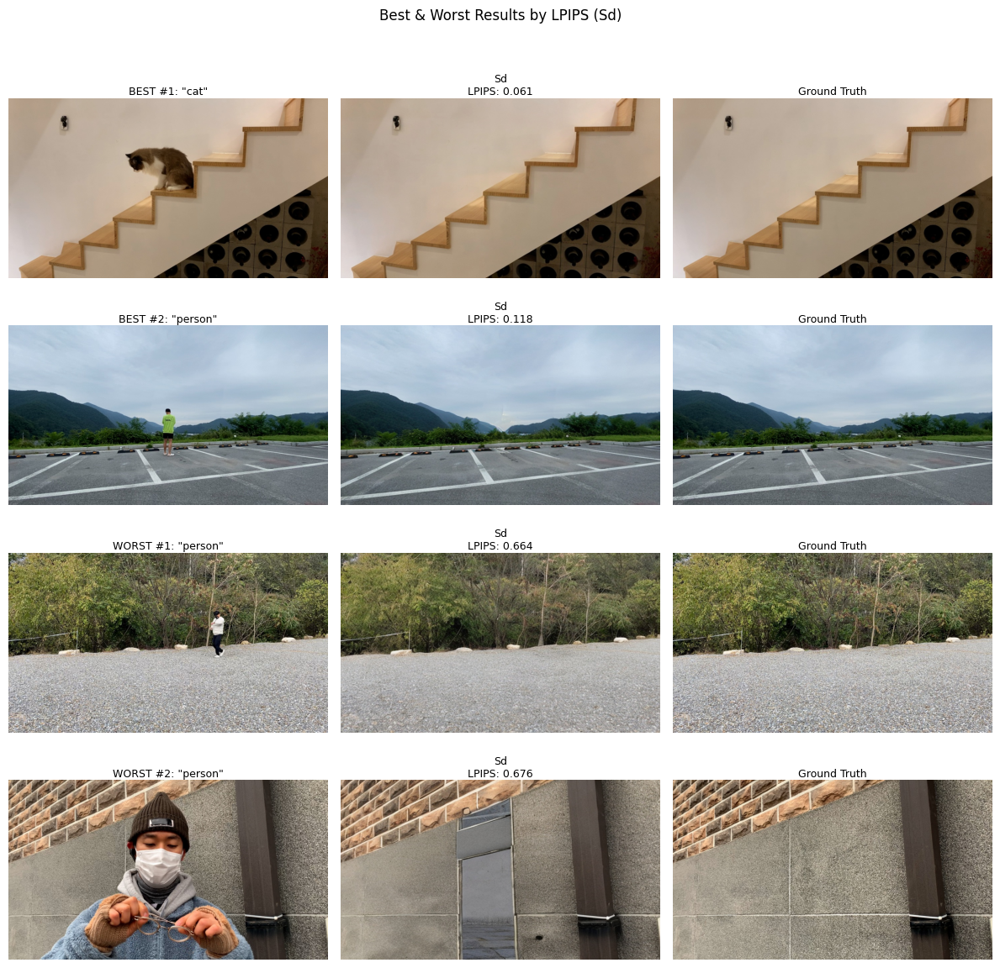


 Summary:
Best LPIPS: 0.061
Worst LPIPS: 0.676


In [43]:
show_best_worst_results(results_sd, sort_by='psnr', num_best=2, num_worst=2, method="sd")
show_best_worst_results(results_sd, sort_by='ssim', num_best=2, num_worst=2, method="sd")
show_best_worst_results(results_sd, sort_by='lpips', num_best=2, num_worst=2, method="sd")

## STATISTICAL ANALYSIS

In [41]:
import scipy.stats as stats
import numpy as np
from scipy.stats import shapiro, anderson, ttest_rel, wilcoxon, mannwhitneyu
from scipy.stats import kruskal, pearsonr, spearmanr
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.utils import resample

def test_normality(data, metric_name):
    """Test if data follows normal distribution"""
    print(f"\n Normality Tests for {metric_name}:")
    print("-" * 40)

    # Shapiro-Wilk test
    stat, p_value = shapiro(data)
    print(f"Shapiro-Wilk: statistic={stat:.4f}, p-value={p_value:.4f}")
    print(f"{'Normal' if p_value > 0.05 else 'Not Normal'} (α=0.05)")

    # Anderson-Darling test
    ad_stat, critical_vals, significance_levels = anderson(data, dist='norm')
    print(f"Anderson-Darling: statistic={ad_stat:.4f}")

    # Check against critical values
    for i, level in enumerate(significance_levels):
        if ad_stat > critical_vals[i]:
            result = f"Not Normal at {level}% level"
        else:
            result = f"Normal at {level}% level"
        print(f"  {level}%: {result}")

    return p_value > 0.05

def compare_methods_stats(results1, results2, method1_name="Method 1", method2_name="Method 2"):
    """Statistical comparison between two methods"""

    print(f"\n STATISTICAL COMPARISON: {method1_name} vs {method2_name}")
    print("=" * 60)

    if len(results1['psnr_scores']) != len(results2['psnr_scores']):
        print("Cannot compare - different number of samples")
        return

    metrics = ['psnr_scores', 'ssim_scores', 'lpips_scores']
    metric_names = ['PSNR', 'SSIM', 'LPIPS']

    comparison_results = {}

    for metric, name in zip(metrics, metric_names):
        print(f"\n {name} Analysis:")
        print("-" * 30)

        data1 = np.array(results1[metric])
        data2 = np.array(results2[metric])

        # Descriptive statistics
        print(f"{method1_name}: Mean={np.mean(data1):.4f}, Std={np.std(data1):.4f}")
        print(f"{method2_name}: Mean={np.mean(data2):.4f}, Std={np.std(data2):.4f}")

        # Test normality of differences (for paired tests)
        differences = data1 - data2
        is_normal = test_normality(differences, f"{name} differences")

        if is_normal:
            # Paired t-test
            stat, p_value = ttest_rel(data1, data2)
            test_name = "Paired t-test"
        else:
            # Wilcoxon signed-rank test
            stat, p_value = wilcoxon(data1, data2, zero_method='zsplit')
            test_name = "Wilcoxon signed-rank"

        print(f"\n{test_name}: statistic={stat:.4f}, p-value={p_value:.4f}")

        alpha = 0.05
        if p_value < alpha:
            print(f"Significant difference (p < {alpha})")
            winner = method1_name if np.mean(data1) > np.mean(data2) else method2_name
            if name == 'LPIPS':
                winner = method1_name if np.mean(data1) < np.mean(data2) else method2_name
            print(f"{winner} performs significantly better")
        else:
            print(f"No significant difference (p ≥ {alpha})")

        pooled_std = np.sqrt((np.var(data1) + np.var(data2)) / 2)
        cohens_d = (np.mean(data1) - np.mean(data2)) / pooled_std

        if abs(cohens_d) < 0.2:
            effect_interpretation = "negligible"
        elif abs(cohens_d) < 0.5:
            effect_interpretation = "small"
        elif abs(cohens_d) < 0.8:
            effect_interpretation = "medium"
        else:
            effect_interpretation = "large"

        print(f"Effect size (Cohen's d): {cohens_d:.4f} ({effect_interpretation})")

        n_bootstrap = 1000
        bootstrap_diffs = []
        for _ in range(n_bootstrap):
            idx = resample(range(len(data1)))
            bootstrap_diffs.append(np.mean(data1[idx]) - np.mean(data2[idx]))

        ci_lower = np.percentile(bootstrap_diffs, 2.5)
        ci_upper = np.percentile(bootstrap_diffs, 97.5)
        print(f"95% CI for difference: [{ci_lower:.4f}, {ci_upper:.4f}]")

        comparison_results[name] = {
            'p_value': p_value,
            'effect_size': cohens_d,
            'significant': p_value < alpha,
            'test_used': test_name,
            'ci_lower': ci_lower,
            'ci_upper': ci_upper
        }

    return comparison_results

def analyze_correlations(results):
    """Analyze correlations between metrics"""

    print(f"\n CORRELATION ANALYSIS")
    print("=" * 40)

    metrics_data = {
        'PSNR': np.array(results['psnr_scores']),
        'SSIM': np.array(results['ssim_scores']),
        'LPIPS': np.array(results['lpips_scores'])
    }

    metric_pairs = [('PSNR', 'SSIM'), ('PSNR', 'LPIPS'), ('SSIM', 'LPIPS')]

    for metric1, metric2 in metric_pairs:
        data1 = metrics_data[metric1]
        data2 = metrics_data[metric2]

        pearson_r, pearson_p = pearsonr(data1, data2)

        spearman_r, spearman_p = spearmanr(data1, data2)

        print(f"\n{metric1} vs {metric2}:")
        print(f"  Pearson r: {pearson_r:.4f} (p={pearson_p:.4f})")
        print(f"  Spearman ρ: {spearman_r:.4f} (p={spearman_p:.4f})")

        abs_r = abs(pearson_r)
        if abs_r < 0.1:
            strength = "negligible"
        elif abs_r < 0.3:
            strength = "weak"
        elif abs_r < 0.5:
            strength = "moderate"
        elif abs_r < 0.7:
            strength = "strong"
        else:
            strength = "very strong"

        direction = "positive" if pearson_r > 0 else "negative"
        print(f"Interpretation: {strength} {direction} correlation")

        if pearson_p < 0.05:
            print("Statistically significant")
        else:
            print("Not statistically significant")


def create_statistical_report(results1, results2=None, method1_name="LaMa", method2_name="Stable Diffusion"):
    """Generate comprehensive statistical report"""

    print("COMPREHENSIVE STATISTICAL ANALYSIS REPORT")
    print("=" * 60)

    print(f"\n1. DESCRIPTIVE STATISTICS - {method1_name}")
    print("-" * 40)

    for metric, name in zip(['psnr_scores', 'ssim_scores', 'lpips_scores'], ['PSNR', 'SSIM', 'LPIPS']):
        data = np.array(results1[metric])
        print(f"\n{name}:")
        print(f"  Mean: {np.mean(data):.4f}")
        print(f"  Median: {np.median(data):.4f}")
        print(f"  Std: {np.std(data):.4f}")
        print(f"  Min: {np.min(data):.4f}")
        print(f"  Max: {np.max(data):.4f}")
        print(f"  25th percentile: {np.percentile(data, 25):.4f}")
        print(f"  75th percentile: {np.percentile(data, 75):.4f}")

    print(f"\n2. NORMALITY TESTS - {method1_name}")
    print("-" * 40)

    for metric, name in zip(['psnr_scores', 'ssim_scores', 'lpips_scores'], ['PSNR', 'SSIM', 'LPIPS']):
        test_normality(results1[metric], name)

    analyze_correlations(results1)

    if results2 is not None:
        comparison_results = compare_methods_stats(results1, results2, method1_name, method2_name)
        return comparison_results

    return None

In [39]:
create_statistical_report(results_lama, method1_name="LaMa")
create_statistical_report(results_sd, method1_name="Stable-Diffusion")
compare_methods_stats(results_lama, results_sd, method1_name="LaMa", method2_name="Stable-Diffusion")

COMPREHENSIVE STATISTICAL ANALYSIS REPORT

1. DESCRIPTIVE STATISTICS - LaMa
----------------------------------------

PSNR:
  Mean: 22.7830
  Median: 22.0398
  Std: 5.0213
  Min: 14.5750
  Max: 35.3125
  25th percentile: 18.7858
  75th percentile: 26.3943

SSIM:
  Mean: 0.8233
  Median: 0.8467
  Std: 0.1303
  Min: 0.2707
  Max: 0.9764
  25th percentile: 0.7910
  75th percentile: 0.9222

LPIPS:
  Mean: 0.1149
  Median: 0.0993
  Std: 0.0755
  Min: 0.0092
  Max: 0.3634
  25th percentile: 0.0488
  75th percentile: 0.1659

2. NORMALITY TESTS - LaMa
----------------------------------------

 Normality Tests for PSNR:
----------------------------------------
Shapiro-Wilk: statistic=0.9673, p-value=0.1800
Normal (α=0.05)
Anderson-Darling: statistic=0.5127
  15.0%: Normal at 15.0% level
  10.0%: Normal at 10.0% level
  5.0%: Normal at 5.0% level
  2.5%: Normal at 2.5% level
  1.0%: Normal at 1.0% level

 Normality Tests for SSIM:
----------------------------------------
Shapiro-Wilk: statistic=

{'PSNR': {'p_value': 2.433608869978343e-13,
  'effect_size': 0.9155244146258911,
  'significant': True,
  'test_used': 'Wilcoxon signed-rank',
  'ci_lower': 3.324794163430138,
  'ci_upper': 4.956719195489884},
 'SSIM': {'p_value': 2.378664858388906e-15,
  'effect_size': 1.7499347431231103,
  'significant': True,
  'test_used': 'Paired t-test',
  'ci_lower': 0.2454539998994466,
  'ci_upper': 0.3526373050203245},
 'LPIPS': {'p_value': 2.5610679600073297e-17,
  'effect_size': -2.0584667816604356,
  'significant': True,
  'test_used': 'Paired t-test',
  'ci_lower': -0.2710554488748312,
  'ci_upper': -0.20073066194774583}}